In [1]:
import numpy as np
import pandas as pd
pd.get_option("display.max_columns")
pd.set_option('display.max_columns', 1000)
pd.get_option("display.max_rows")
pd.set_option('display.max_rows', 1000)

f=open('aaindex1.dat', 'r')
er=open('er_5win.fas','r')

fragI=0
raw=''
ID=''
ID_array=[]
AAall=[[]]

while True:
    data = f.readline()
    data = data.rstrip()
    if data.startswith('I'):
        fragI = 1
    elif data.startswith('H'):
        ID=data[2:]
    elif fragI==1 and not data.startswith('//'):
        raw+=data
    elif data.startswith('//'):
        para = raw.split()
        AAall.append(para)
        ID_array.append(ID)
        raw=''
        fragI=0
    elif data == '':
        break

AAall.remove([])

columns=['A','R','N','D','C','Q','E','G','H','I','L','K','M','F','P','S','T','W','Y','V']

df_index=pd.DataFrame(AAall,index=ID_array,columns=columns)

df_index


,A,R,N,D,C,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
ANDN920101,4.35,4.38,4.75,4.76,4.65,4.37,4.29,3.97,4.63,3.95,4.17,4.36,4.52,4.66,4.44,4.50,4.35,4.70,4.60,3.95
ARGP820101,0.61,0.60,0.06,0.46,1.07,0.,0.47,0.07,0.61,2.22,1.53,1.15,1.18,2.02,1.95,0.05,0.05,2.65,1.88,1.32
ARGP820102,1.18,0.20,0.23,0.05,1.89,0.72,0.11,0.49,0.31,1.45,3.23,0.06,2.67,1.96,0.76,0.97,0.84,0.77,0.39,1.08
ARGP820103,1.56,0.45,0.27,0.14,1.23,0.51,0.23,0.62,0.29,1.67,2.93,0.15,2.96,2.03,0.76,0.81,0.91,1.08,0.68,1.14
BEGF750101,1.,0.52,0.35,0.44,0.06,0.44,0.73,0.35,0.60,0.73,1.,0.60,1.,0.60,0.06,0.35,0.44,0.73,0.44,0.82
BEGF750102,0.77,0.72,0.55,0.65,0.65,0.72,0.55,0.65,0.83,0.98,0.83,0.55,0.98,0.98,0.55,0.55,0.83,0.77,0.83,0.98
BEGF750103,0.37,0.84,0.97,0.97,0.84,0.64,0.53,0.97,0.75,0.37,0.53,0.75,0.64,0.53,0.97,0.84,0.75,0.97,0.84,0.37
BHAR880101,0.357,0.529,0.463,0.511,0.346,0.493,0.497,0.544,0.323,0.462,0.365,0.466,0.295,0.314,0.509,0.507,0.444,0.305,0.420,0.386
BIGC670101,52.6,109.1,75.7,68.4,68.3,89.7,84.7,36.3,91.9,102.0,102.0,105.1,97.7,113.9,73.6,54.9,71.2,135.4,116.2,85.1
BIOV880101,16.,-70.,-74.,-78.,168.,-73.,-106.,-13.,50.,151.,145.,-141.,124.,189.,-20.,-70.,-38.,145.,53.,123.


In [2]:
er=open('er_5win.fas','r')

fas = [[]]

while True:
    reading = er.readline()
    reading = reading.rstrip()

    if not reading.startswith('>'):
        if reading == '':
            break
        fas.append(list(reading))

fas.remove([])
columns=list(range(-15,16))
df_er=pd.DataFrame(fas,columns=columns)

df_er

,-15,-14,-13,-12,-11,-10,-9,-8,-7,-6,-5,-4,-3,-2,-1,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
0,X,X,X,X,X,X,R,K,K,Y,F,G,F,L,I,L,G,V,L,L,A,G,Y,I,Y,V,P,L,P,D,N
1,X,X,X,X,X,X,X,G,K,T,I,S,L,L,I,S,V,V,L,V,A,Y,Y,L,Y,I,P,L,P,D,A
2,X,X,X,X,X,X,X,G,R,T,I,F,L,L,I,S,V,V,L,V,A,Y,Y,I,Y,I,P,L,P,D,D
3,X,X,X,X,X,X,X,A,A,S,C,L,V,L,L,A,L,C,L,L,L,P,L,L,L,L,G,G,W,K,R
4,X,X,X,X,A,A,S,C,V,A,L,L,V,L,A,L,L,L,L,V,L,L,L,G,L,W,K,R,G,R,Q
5,X,X,X,X,X,X,X,A,A,S,C,L,V,L,L,A,L,C,L,L,L,P,L,L,L,L,G,G,W,K,R
6,L,A,V,L,G,A,A,L,A,A,A,A,L,V,L,I,S,I,V,A,F,T,T,A,T,K,M,P,A,L,H
7,L,G,L,G,V,A,L,A,A,A,A,L,I,L,V,S,I,V,A,F,I,T,A,T,K,M,P,P,C,Y,Q
8,R,N,V,T,L,T,L,S,W,Q,V,I,P,I,A,G,I,L,P,L,V,T,G,S,G,R,V,S,V,P,F
9,R,N,V,T,L,T,L,S,W,Q,V,I,P,I,A,G,I,L,P,L,V,T,G,S,G,R,V,S,V,P,F


In [3]:
ALLave=[[]]

k=0
while k<len(df_index.index):
    l=0
    value=[]
    while l<len(df_index.columns):
        if df_index.iat[k,l]=="NA":
            value.append(0)
        else:
            value.append(float(df_index.iat[k,l]))
        l=l+1


    j=0
    AAnum=[[]]
    while j<len(df_er.index):
        i=0
        AA=[]
        while i<=30:
            AA.append(df_er.iat[j,i])
            if AA[i]=="A":
                AA[i]=value[0]
            elif AA[i]=="R":
                AA[i]=value[1]
            elif AA[i]=="N":
                AA[i]=value[2]
            elif AA[i]=="D":
                AA[i]=value[3]
            elif AA[i]=="C":
                AA[i]=value[4]
            elif AA[i]=="Q":
                AA[i]=value[5]
            elif AA[i]=="E":
                AA[i]=value[6]
            elif AA[i]=="G":
                AA[i]=value[7]
            elif AA[i]=="H":
                AA[i]=value[8]
            elif AA[i]=="I":
                AA[i]=value[9]
            elif AA[i]=="L":
                AA[i]=value[10]
            elif AA[i]=="K":
                AA[i]=value[11]
            elif AA[i]=="M":
                AA[i]=value[12]
            elif AA[i]=="F":
                AA[i]=value[13]
            elif AA[i]=="P":
                AA[i]=value[14]
            elif AA[i]=="S":
                AA[i]=value[15]
            elif AA[i]=="T":
                AA[i]=value[16]
            elif AA[i]=="W":
                AA[i]=value[17]
            elif AA[i]=="Y":
                AA[i]=value[18]
            elif AA[i]=="V":
                AA[i]=value[19]
            elif AA[i]=="X":
                # valueリストを最初の20要素のみに制限
                initial20values = value[:20]

                # その合計値を取得
                sumAA = sum(initial20values)
                AA[i]=sumAA/20

            i=i+1
        AAnum.append(AA)
        j=j+1
    df_AAnum=pd.DataFrame(AAnum)
    #print (df_AAnum)

    ave=df_AAnum.mean()
    ALLave.append(ave)

    k=k+1

print ('fin!')

fin!


In [4]:

columns=list(range(-15,16))
ID_array.insert(0,'0')
erave=pd.DataFrame(ALLave,index=ID_array,columns=columns)

erave


,-15,-14,-13,-12,-11,-10,-9,-8,-7,-6,-5,-4,-3,-2,-1,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ANDN920101,4.375800,4.409343,4.372843,4.373200,4.348457,4.317429,4.358129,4.364814,4.339771,4.430686,4.139771,4.194171,4.253771,4.174914,4.251314,4.202914,4.214857,4.316857e+00,4.250686,4.194800,4.153657,4.393429,4.324800,4.377886,4.360500,4.380329,4.322729,4.369129,4.362557,4.412729,4.376843
ARGP820101,0.991286,0.774771,0.900271,0.935657,1.022114,1.063943,0.986757,0.886243,1.200571,0.873371,1.371143,1.455429,1.296629,1.269314,1.227543,1.165486,1.184571,1.265200e+00,1.281257,1.291657,1.363657,1.000400,1.142857,1.134914,1.141014,1.111586,1.216843,0.895414,0.920100,0.986271,0.892900
ARGP820102,1.118960,0.896160,1.284514,1.070549,1.194983,1.118903,1.320400,1.064366,1.137829,0.953943,1.891257,2.378343,1.912514,1.891314,2.043371,1.676457,1.797543,1.931600e+00,2.083314,1.872229,1.838971,1.134743,1.388171,1.372171,1.426629,1.115840,1.291383,1.083726,1.140526,0.857211,1.092811
ARGP820103,1.188949,0.951920,1.316371,1.123783,1.231794,1.203577,1.342429,1.107789,1.221257,1.058457,1.869771,2.277429,1.887371,1.870971,1.980514,1.658343,1.765543,1.886229e+00,2.004514,1.852743,1.866457,1.188400,1.408514,1.414629,1.433057,1.208566,1.310966,1.090280,1.111194,0.932109,1.117537
BEGF750101,0.647189,0.555589,0.663514,0.634149,0.591954,0.666674,0.659800,0.582851,0.619371,0.588800,0.839200,0.865143,0.788914,0.823371,0.797086,0.701371,0.742229,7.280571e-01,0.798971,0.799543,0.822629,0.578457,0.647371,0.683429,0.615114,0.618497,0.605069,0.601297,0.569126,0.567069,0.580326
BEGF750102,0.738149,0.720206,0.742914,0.766869,0.738937,0.766720,0.751371,0.743474,0.782343,0.729029,0.876229,0.863257,0.826000,0.856743,0.817943,0.820114,0.819771,8.286286e-01,0.822971,0.850971,0.864400,0.750057,0.762743,0.783143,0.797086,0.770023,0.791223,0.748480,0.717623,0.760251,0.739909
BEGF750103,0.708469,0.742126,0.678400,0.677451,0.689931,0.656526,0.642457,0.692149,0.682400,0.711543,0.466629,0.521371,0.544686,0.505029,0.562400,0.591829,0.560800,5.768000e-01,0.536000,0.512743,0.499600,0.736571,0.683257,0.625314,0.640971,0.695189,0.665646,0.695303,0.703703,0.709303,0.698274
BHAR880101,0.420582,0.438839,0.424863,0.424729,0.434761,0.423565,0.419709,0.433488,0.419646,0.424514,0.384503,0.380897,0.386263,0.392926,0.386674,0.412731,0.404011,3.769086e-01,0.379960,0.388600,0.394411,0.420771,0.419069,0.401749,0.407846,0.421807,0.419184,0.431853,0.442395,0.432087,0.436310
BIGC670101,88.250514,82.248800,83.122000,87.320457,83.696914,87.792229,86.659714,83.236971,89.918286,80.901714,87.137714,94.877714,86.650286,87.226857,85.952571,81.739429,82.468571,8.571714e+01,85.534286,85.743429,86.089714,83.203429,87.470286,87.283429,84.789429,88.465771,86.470343,85.628629,85.500629,86.794914,83.460057


In [5]:
gol=open('gol_5win.fas','r')

fas = [[]]

while True:
    reading = gol.readline()
    reading = reading.rstrip()

    if not reading.startswith('>'):
        if reading == '':
            break
        fas.append(list(reading))

fas.remove([])
columns=list(range(-15,16))
df_gol=pd.DataFrame(fas,columns=columns)

df_gol

,-15,-14,-13,-12,-11,-10,-9,-8,-7,-6,-5,-4,-3,-2,-1,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
0,R,A,W,K,R,I,F,W,R,Q,I,L,L,T,L,G,L,L,G,L,F,L,Y,G,L,P,K,F,R,H,L
1,V,A,Q,Q,E,A,R,R,R,N,L,T,I,G,L,T,V,F,A,V,G,R,Y,L,E,K,Y,L,E,H,F
2,L,R,A,K,K,R,L,L,W,R,L,F,L,S,A,F,G,L,L,G,L,Y,H,Y,W,F,K,I,F,R,L
3,R,L,L,R,G,A,P,R,Q,R,V,C,T,L,F,I,I,G,F,K,F,T,F,F,V,S,I,M,I,Y,W
4,Q,R,V,F,T,F,F,I,I,S,F,K,F,M,F,L,I,S,I,L,I,Y,W,H,T,V,G,A,P,K,D
5,R,L,L,R,G,A,P,R,Q,R,V,C,T,L,F,I,I,G,F,K,F,T,F,F,V,S,I,M,I,Y,W
6,Q,R,V,F,T,L,F,I,I,S,F,K,F,T,F,L,V,S,I,L,I,Y,W,H,T,V,G,A,P,K,D
7,X,X,X,L,K,E,I,Y,L,S,L,S,L,V,L,V,F,A,C,G,L,L,Y,Q,L,T,M,R,S,Q,C
8,K,R,T,F,S,N,L,E,T,F,L,I,F,L,L,V,M,M,S,A,I,T,V,A,L,L,S,L,L,F,I
9,K,R,T,F,S,T,L,E,A,F,L,I,F,L,L,V,I,M,T,V,I,T,V,A,L,L,T,L,L,F,V


In [6]:
ALLave=[[]]

k=0
while k<len(df_index.index):
    l=0
    value=[]
    while l<len(df_index.columns):
        if df_index.iat[k,l]=="NA":
            value.append(0)
        else:
            value.append(float(df_index.iat[k,l]))
        l=l+1


    j=0
    AAnum=[[]]
    while j<len(df_gol.index):
        i=0
        AA=[]
        while i<=30:
            AA.append(df_gol.iat[j,i])
            if AA[i]=="A":
                AA[i]=value[0]
            elif AA[i]=="R":
                AA[i]=value[1]
            elif AA[i]=="N":
                AA[i]=value[2]
            elif AA[i]=="D":
                AA[i]=value[3]
            elif AA[i]=="C":
                AA[i]=value[4]
            elif AA[i]=="Q":
                AA[i]=value[5]
            elif AA[i]=="E":
                AA[i]=value[6]
            elif AA[i]=="G":
                AA[i]=value[7]
            elif AA[i]=="H":
                AA[i]=value[8]
            elif AA[i]=="I":
                AA[i]=value[9]
            elif AA[i]=="L":
                AA[i]=value[10]
            elif AA[i]=="K":
                AA[i]=value[11]
            elif AA[i]=="M":
                AA[i]=value[12]
            elif AA[i]=="F":
                AA[i]=value[13]
            elif AA[i]=="P":
                AA[i]=value[14]
            elif AA[i]=="S":
                AA[i]=value[15]
            elif AA[i]=="T":
                AA[i]=value[16]
            elif AA[i]=="W":
                AA[i]=value[17]
            elif AA[i]=="Y":
                AA[i]=value[18]
            elif AA[i]=="V":
                AA[i]=value[19]
            elif AA[i]=="X":
                # valueリストを最初の20要素のみに制限
                initial20values = value[:20]

                # その合計値を取得
                sumAA = sum(initial20values)
                AA[i]=sumAA/20

            i=i+1
        AAnum.append(AA)
        j=j+1
    df_AAnum=pd.DataFrame(AAnum)
    #print (df_AAnum)

    ave=df_AAnum.mean()
    ALLave.append(ave)

    k=k+1

print ('fin!')

fin!


In [7]:

columns=list(range(-15,16))
golave=pd.DataFrame(ALLave,index=ID_array,columns=columns)

golave


,-15,-14,-13,-12,-11,-10,-9,-8,-7,-6,-5,-4,-3,-2,-1,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ANDN920101,4.382347,4.392055,4.354995,4.354388,4.367467,4.327787,4.350430,4.376004,4.346539,4.423690,4.161300,4.218585,4.245717,4.271989,4.292065,4.226673,4.211033,4.295430,4.229044,4.229025,4.237706,4.421338,4.355908,4.335258,4.356233,4.375774,4.342658,4.389254,4.393843,4.390765,4.395277
ARGP820101,0.967682,0.979857,0.923485,1.154407,0.930774,1.147194,0.937390,1.086730,1.011816,0.838126,1.424436,1.367304,1.361568,1.181989,1.233901,1.280975,1.261090,1.184933,1.315468,1.383518,1.520937,1.038566,1.148757,1.147247,1.139732,1.135430,1.111300,1.016883,0.946558,1.015908,0.837476
ARGP820102,1.029851,1.064436,1.077606,1.088141,1.080933,1.131725,1.166467,1.194187,1.222524,1.044283,2.232830,2.118681,2.133423,1.670268,1.955985,1.906195,1.896654,1.683346,2.016616,1.766138,1.944837,1.291874,1.272715,1.374704,1.460727,1.260421,1.322390,1.059694,0.978413,1.055583,0.953270
ARGP820103,1.078564,1.118776,1.113979,1.148922,1.101981,1.176461,1.168153,1.250363,1.251185,1.105889,2.163461,2.022065,2.063537,1.721874,1.889809,1.895239,1.859369,1.679656,1.915641,1.761530,1.923021,1.355698,1.333709,1.400096,1.458145,1.284302,1.320880,1.102753,1.009331,1.086195,0.977247
BEGF750101,0.578120,0.587859,0.574576,0.625484,0.566956,0.617317,0.586753,0.632772,0.628757,0.596922,0.880459,0.779579,0.814704,0.770421,0.733709,0.793824,0.780210,0.695315,0.757170,0.748317,0.774187,0.621377,0.663136,0.653920,0.659675,0.611836,0.616864,0.597916,0.570880,0.554359,0.550019
BEGF750102,0.743966,0.741300,0.739419,0.752153,0.720815,0.752914,0.735744,0.756807,0.763518,0.723824,0.874379,0.835832,0.850497,0.841683,0.831281,0.847304,0.847553,0.834379,0.841759,0.864111,0.888145,0.766711,0.780363,0.790688,0.778107,0.773862,0.772906,0.730975,0.737323,0.731855,0.714685
BEGF750103,0.719250,0.725908,0.704019,0.701801,0.722337,0.699193,0.703400,0.683996,0.681759,0.719101,0.488719,0.540574,0.525296,0.533289,0.572658,0.541644,0.538566,0.588279,0.551205,0.525717,0.505889,0.716004,0.649962,0.650784,0.660287,0.688031,0.670402,0.711683,0.712371,0.706960,0.725086
BHAR880101,0.438176,0.433734,0.437634,0.427307,0.443395,0.435563,0.439073,0.421686,0.426512,0.424598,0.378707,0.386790,0.375113,0.387874,0.382344,0.389857,0.394402,0.392576,0.387231,0.389845,0.376860,0.411145,0.411952,0.412853,0.414061,0.421723,0.423270,0.435633,0.436172,0.439916,0.447851
BIGC670101,90.339407,88.975143,84.309732,93.782486,87.206386,93.465411,86.338547,89.577438,88.828489,82.291587,92.378203,88.358126,90.163289,83.263289,86.268451,87.910325,86.550096,85.121224,89.057744,88.975335,93.434417,86.530593,88.449522,87.552772,89.717782,90.498853,88.144551,84.991587,87.933843,84.421606,81.591013


In [8]:
pm=open('pm_5win.fas','r')

fas = [[]]

while True:
    reading = pm.readline()
    reading = reading.rstrip()

    if not reading.startswith('>'):
        if reading == '':
            break
        fas.append(list(reading))

fas.remove([])
columns=list(range(-15,16))
df_pm=pd.DataFrame(fas,columns=columns)

ALLave=[[]]

k=0
while k<len(df_index.index):
    l=0
    value=[]
    while l<len(df_index.columns):
        if df_index.iat[k,l]=="NA":
            value.append(0)
        else:
            value.append(float(df_index.iat[k,l]))
        l=l+1


    j=0
    AAnum=[[]]
    while j<len(df_pm.index):
        i=0
        AA=[]
        while i<=30:
            AA.append(df_pm.iat[j,i])
            if AA[i]=="A":
                AA[i]=value[0]
            elif AA[i]=="R":
                AA[i]=value[1]
            elif AA[i]=="N":
                AA[i]=value[2]
            elif AA[i]=="D":
                AA[i]=value[3]
            elif AA[i]=="C":
                AA[i]=value[4]
            elif AA[i]=="Q":
                AA[i]=value[5]
            elif AA[i]=="E":
                AA[i]=value[6]
            elif AA[i]=="G":
                AA[i]=value[7]
            elif AA[i]=="H":
                AA[i]=value[8]
            elif AA[i]=="I":
                AA[i]=value[9]
            elif AA[i]=="L":
                AA[i]=value[10]
            elif AA[i]=="K":
                AA[i]=value[11]
            elif AA[i]=="M":
                AA[i]=value[12]
            elif AA[i]=="F":
                AA[i]=value[13]
            elif AA[i]=="P":
                AA[i]=value[14]
            elif AA[i]=="S":
                AA[i]=value[15]
            elif AA[i]=="T":
                AA[i]=value[16]
            elif AA[i]=="W":
                AA[i]=value[17]
            elif AA[i]=="Y":
                AA[i]=value[18]
            elif AA[i]=="V":
                AA[i]=value[19]
            elif AA[i]=="X":
                # valueリストを最初の20要素のみに制限
                initial20values = value[:20]

                # その合計値を取得
                sumAA = sum(initial20values)
                AA[i]=sumAA/20

            i=i+1
        AAnum.append(AA)
        j=j+1
    df_AAnum=pd.DataFrame(AAnum)
    #print (df_AAnum)

    ave=df_AAnum.mean()
    ALLave.append(ave)

    k=k+1

columns=list(range(-15,16))
pmave=pd.DataFrame(ALLave,index=ID_array,columns=columns)

pmave

,-15,-14,-13,-12,-11,-10,-9,-8,-7,-6,-5,-4,-3,-2,-1,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ANDN920101,4.362874,4.272682,4.345931,4.321802,4.354271,4.376549,4.324646,4.342834,4.359798,4.343644,4.210324,4.217449,4.212186,4.285830,4.218785,4.253360,4.210000,4.201336,4.200769,4.166113,4.086964,4.361822,4.272348,4.328988,4.241255,4.292379,4.323715,4.397804,4.331407,4.323310,4.341022
ARGP820101,1.075992,0.658836,0.889372,1.273947,0.936943,1.015941,0.937480,0.889838,1.161215,0.928462,1.435466,1.437206,1.291336,1.241822,1.295992,1.289838,1.213320,1.307692,1.423360,1.445263,1.544494,0.608016,0.961215,1.073765,1.077004,0.955941,1.196427,1.207723,1.225901,1.375901,1.032196
ARGP820102,1.018186,0.888348,0.909522,1.133692,1.062032,0.963943,1.282688,1.120283,1.405304,1.199231,1.974575,1.968583,1.891457,1.884130,2.169757,2.010526,1.713401,1.836316,1.988502,1.986437,1.679190,1.023360,1.327773,1.475263,1.316356,1.254405,1.565903,1.308211,1.550032,1.582300,1.390057
ARGP820103,1.114915,0.969510,0.999571,1.180178,1.030947,1.024182,1.235032,1.179312,1.432429,1.183887,1.969109,1.928300,1.887895,1.872794,2.121457,1.991012,1.697490,1.830891,1.978462,1.988057,1.768340,1.092794,1.348623,1.564696,1.407976,1.324538,1.549235,1.329478,1.486765,1.591785,1.380741
BEGF750101,0.625717,0.544846,0.526526,0.562194,0.506810,0.540927,0.577202,0.612348,0.624818,0.533117,0.794049,0.782267,0.785789,0.770040,0.849190,0.798543,0.703684,0.761498,0.832470,0.841174,0.835547,0.562227,0.636559,0.696073,0.666194,0.652158,0.651996,0.611915,0.614870,0.687866,0.677688
BEGF750102,0.739085,0.703660,0.722324,0.747385,0.723053,0.712057,0.740964,0.729555,0.784818,0.722146,0.877814,0.869352,0.852551,0.820526,0.846599,0.853522,0.838381,0.862915,0.877530,0.882955,0.910607,0.728704,0.786599,0.800243,0.824089,0.807838,0.788850,0.765976,0.796219,0.809862,0.755255
BEGF750103,0.680437,0.769020,0.750964,0.713514,0.738170,0.777069,0.690955,0.711296,0.684130,0.753360,0.511336,0.496842,0.538138,0.554777,0.533603,0.533765,0.574372,0.550243,0.487166,0.479798,0.424980,0.726478,0.641255,0.617854,0.605830,0.668227,0.641830,0.662883,0.640615,0.633166,0.629093
BHAR880101,0.427410,0.462875,0.450041,0.440794,0.441904,0.446471,0.428224,0.443810,0.416502,0.426652,0.382696,0.379453,0.392393,0.393215,0.380381,0.381530,0.410883,0.397377,0.382866,0.389211,0.402287,0.432344,0.421267,0.404470,0.428700,0.415323,0.414169,0.407562,0.407404,0.399995,0.412164
BIGC670101,86.158543,70.398421,78.420486,89.331822,83.556518,85.045223,80.659798,84.588259,92.110526,77.784211,89.943725,89.026316,86.760324,86.134413,88.772065,87.789879,84.391498,88.349798,91.464372,90.718623,89.383401,70.491498,78.545344,80.895547,83.204858,82.863927,88.782551,87.580121,88.737206,93.562308,83.595020


0


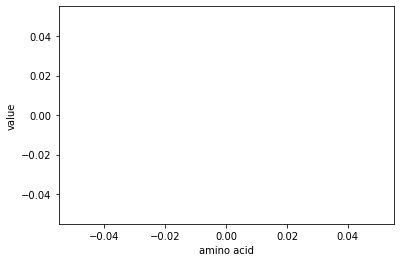

ANDN920101


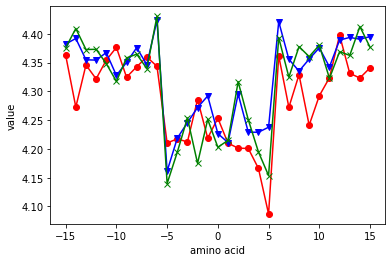

ARGP820101


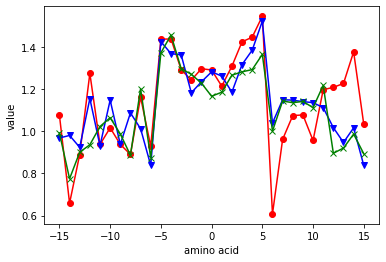

ARGP820102


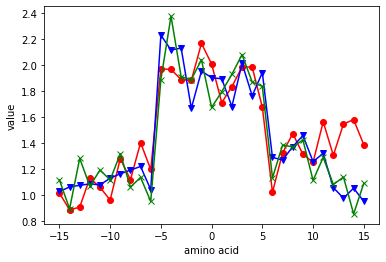

ARGP820103


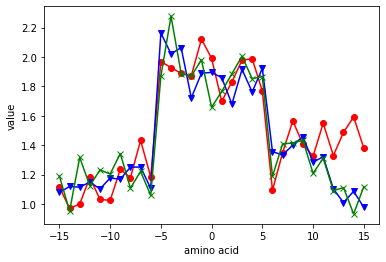

BEGF750101


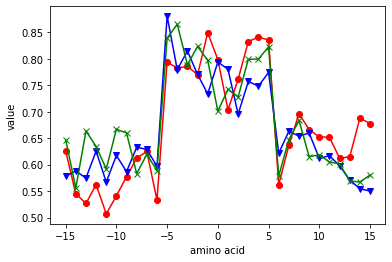

BEGF750102


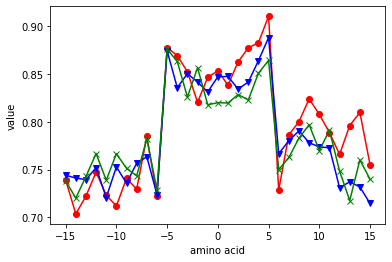

BEGF750103


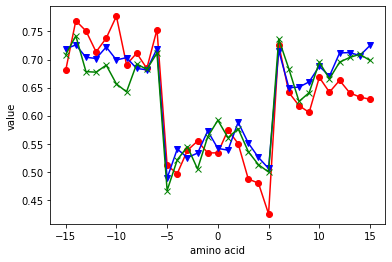

BHAR880101


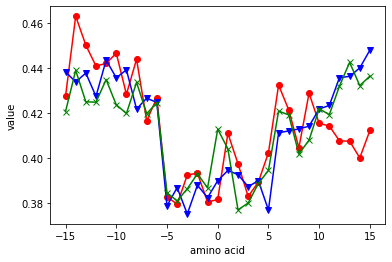

BIGC670101


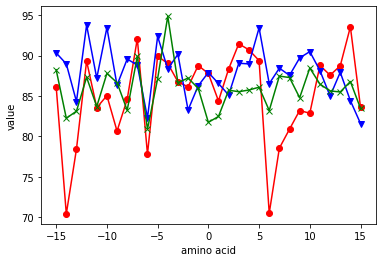

BIOV880101


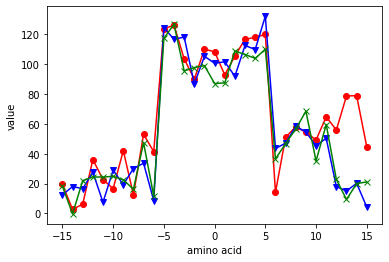

BIOV880102


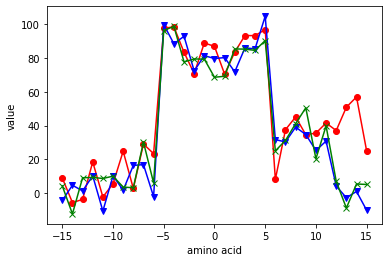

BROC820101


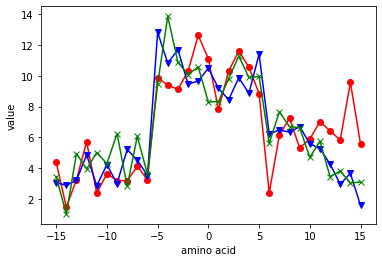

BROC820102


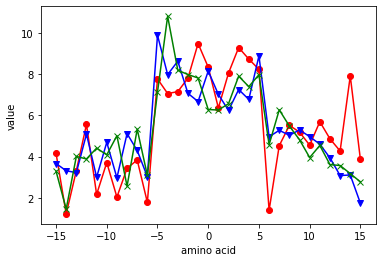

BULH740101


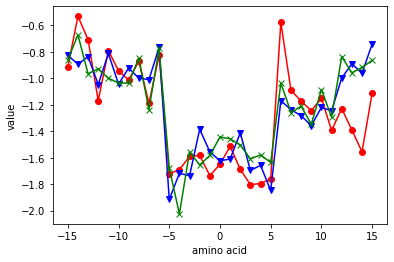

BULH740102


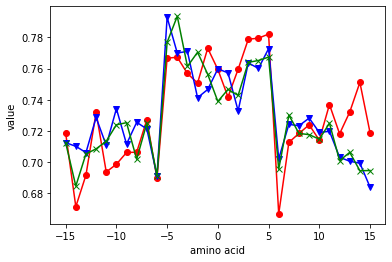

BUNA790101


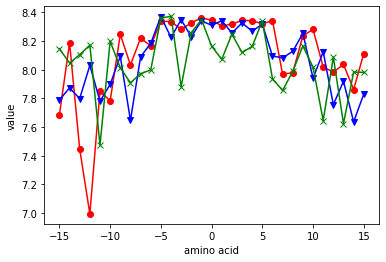

BUNA790102


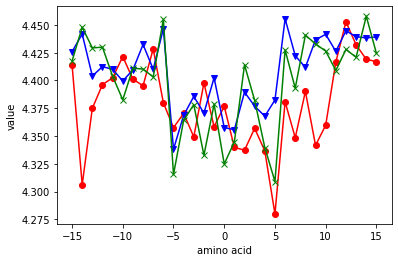

BUNA790103


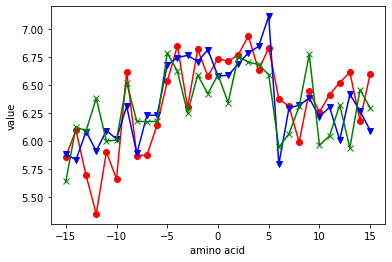

BURA740101


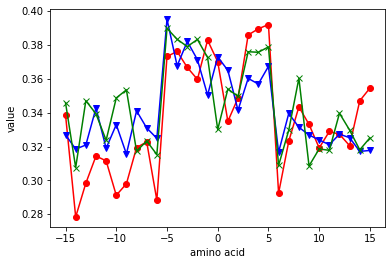

BURA740102


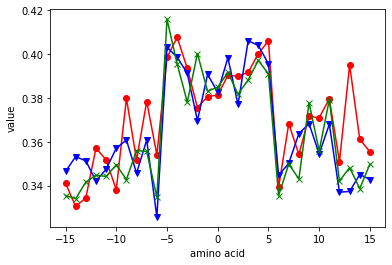

CHAM810101


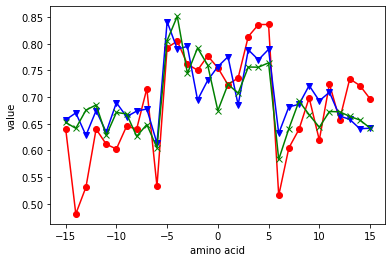

CHAM820101


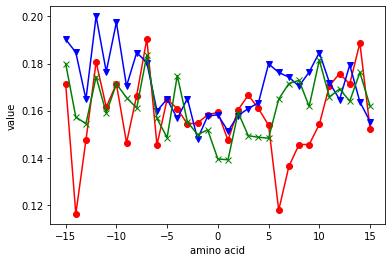

CHAM820102


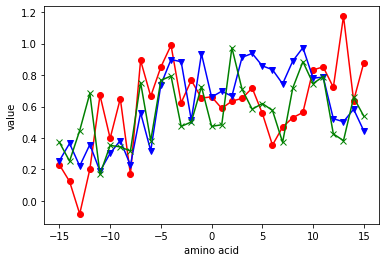

CHAM830101


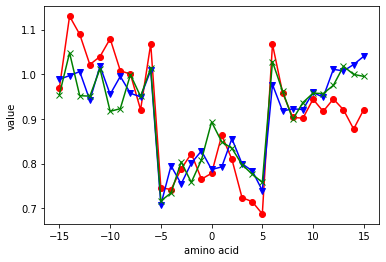

CHAM830102


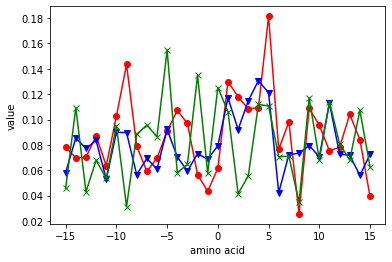

CHAM830103


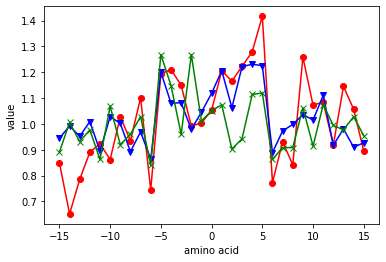

CHAM830104


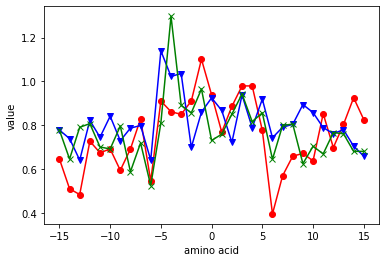

CHAM830105


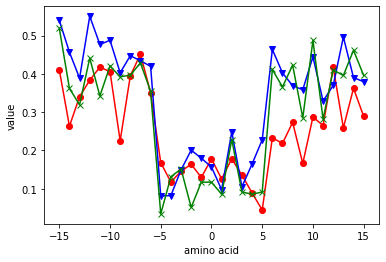

CHAM830106


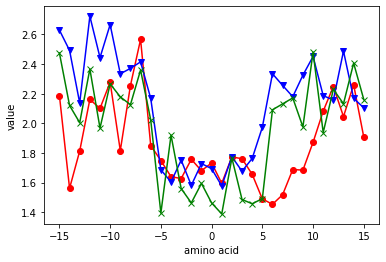

CHAM830107


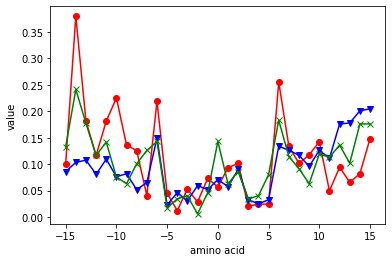

CHAM830108


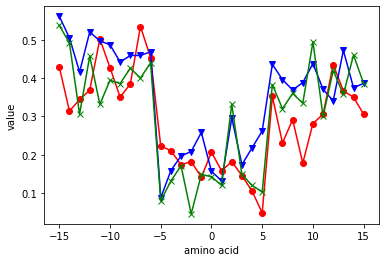

CHOC750101


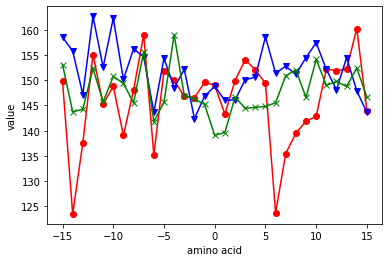

CHOC760101


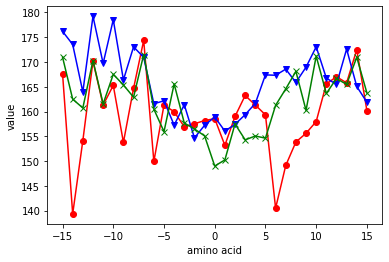

CHOC760102


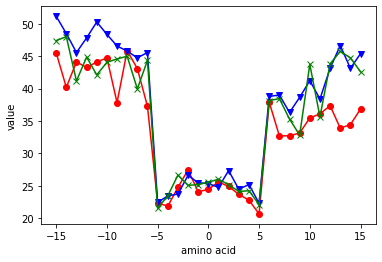

CHOC760103


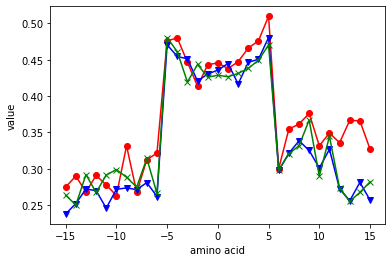

CHOC760104


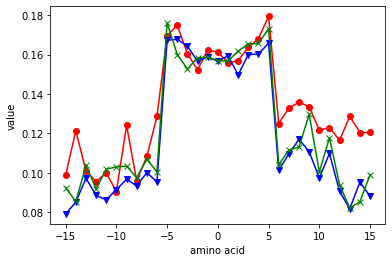

CHOP780101


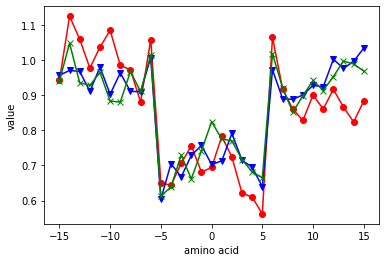

CHOP780201


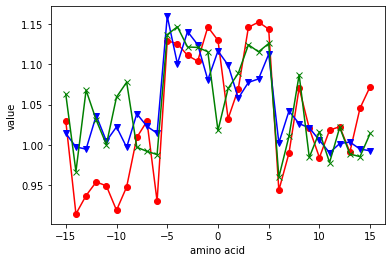

CHOP780202


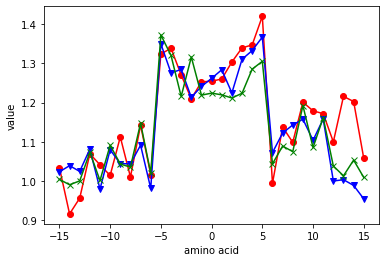

CHOP780203


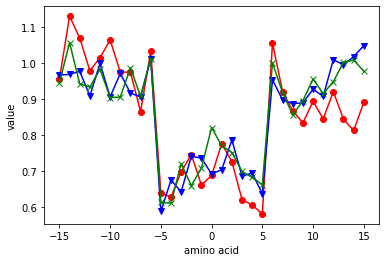

CHOP780204


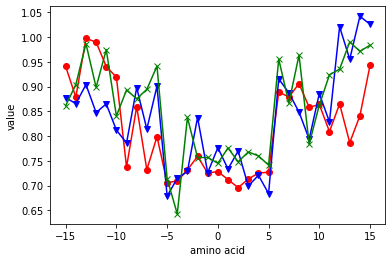

CHOP780205


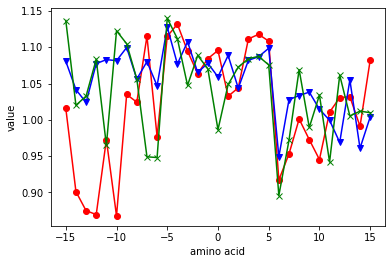

CHOP780206


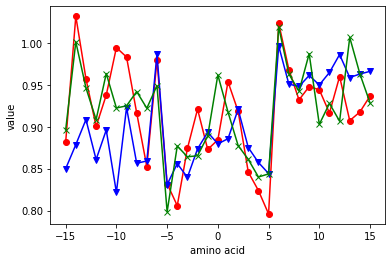

CHOP780207


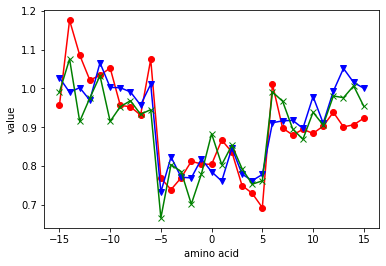

CHOP780208


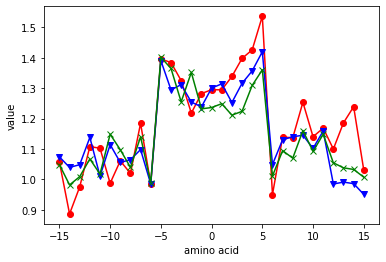

CHOP780209


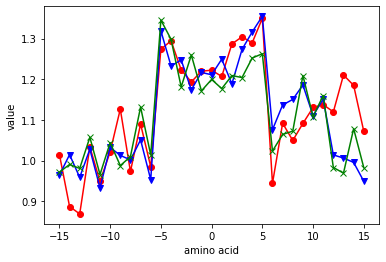

CHOP780210


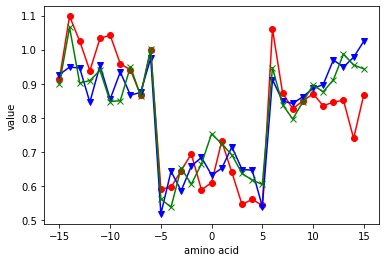

CHOP780211


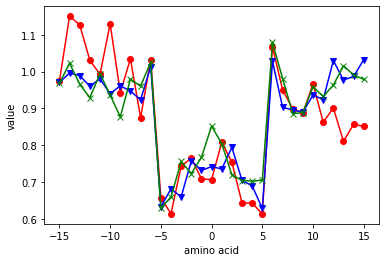

CHOP780212


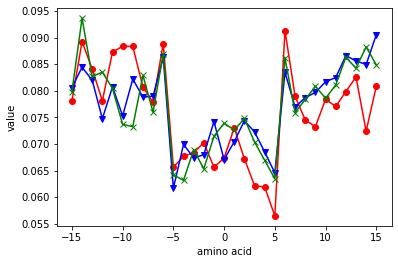

CHOP780213


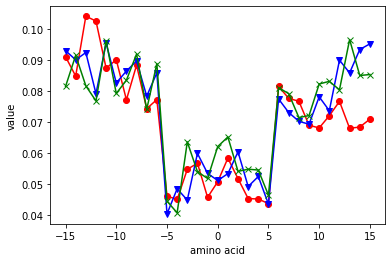

CHOP780214


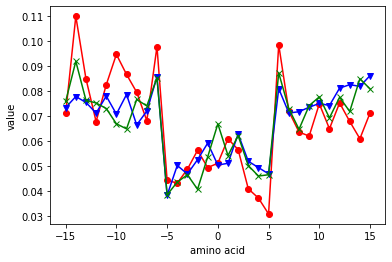

CHOP780215


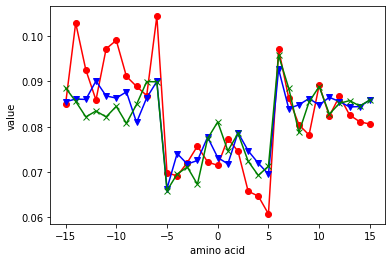

CHOP780216


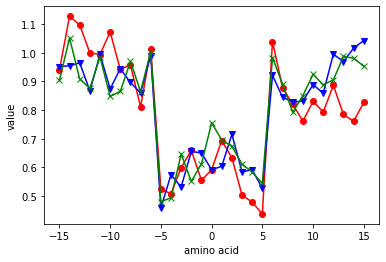

CIDH920101


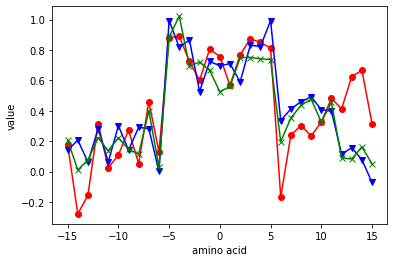

CIDH920102


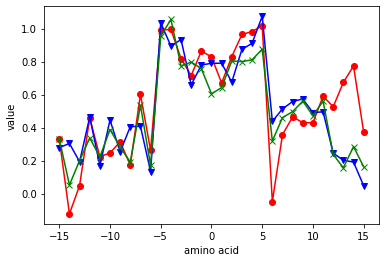

CIDH920103


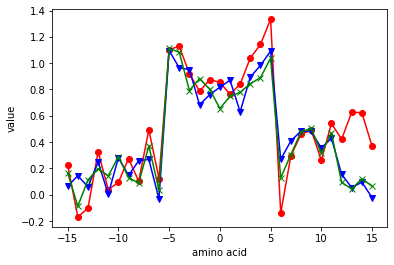

CIDH920104


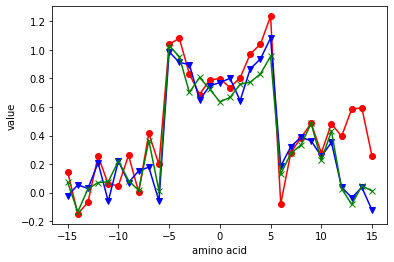

CIDH920105


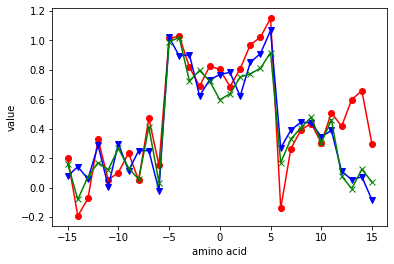

COHE430101


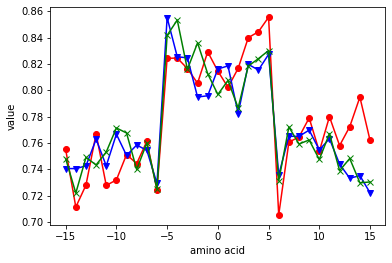

CRAJ730101


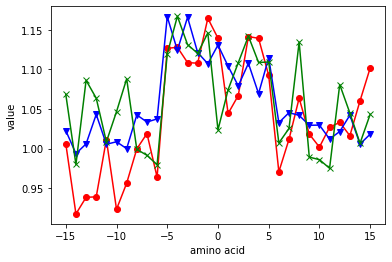

CRAJ730102


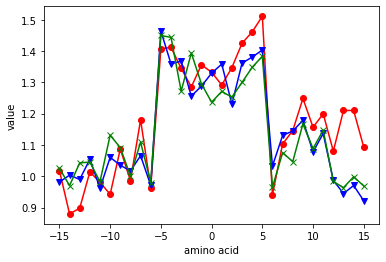

CRAJ730103


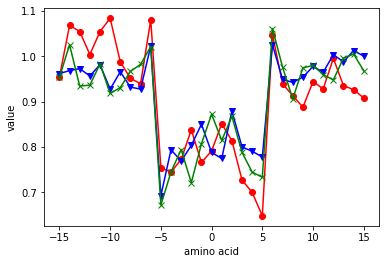

DAWD720101


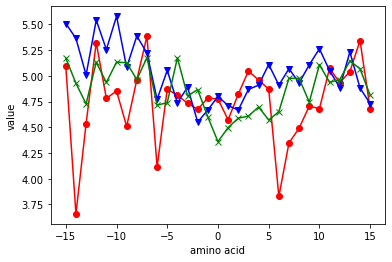

DAYM780101


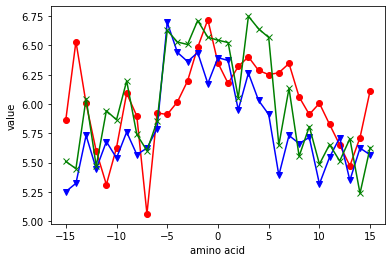

DAYM780201


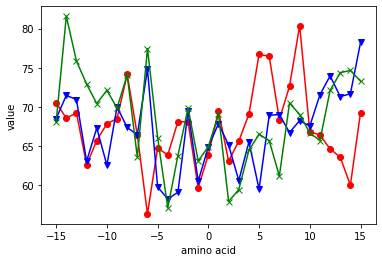

DESM900101


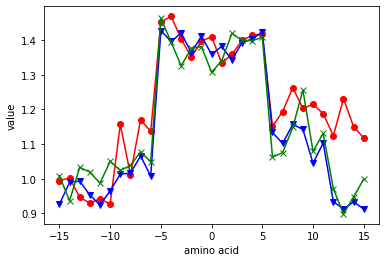

DESM900102


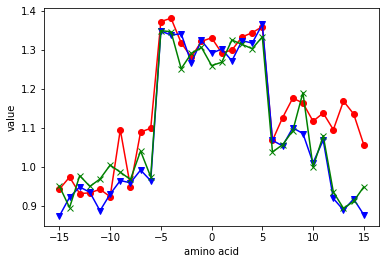

EISD840101


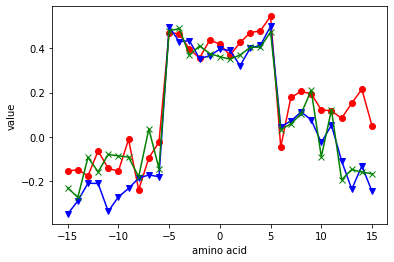

EISD860101


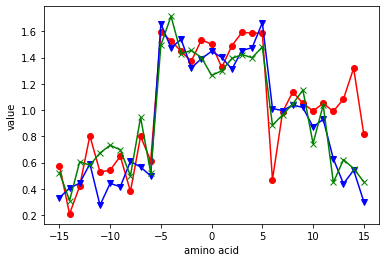

EISD860102


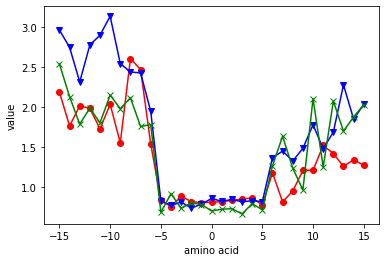

EISD860103


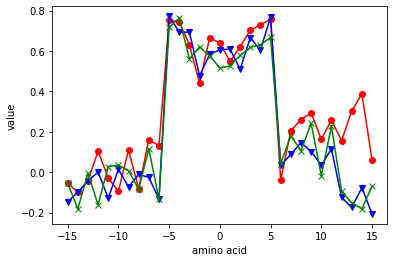

FASG760101


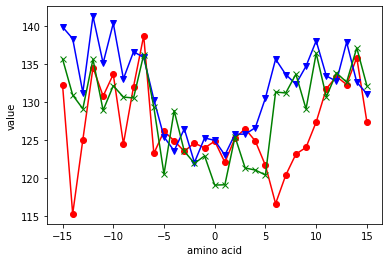

FASG760102


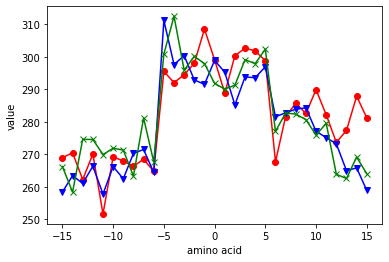

FASG760103


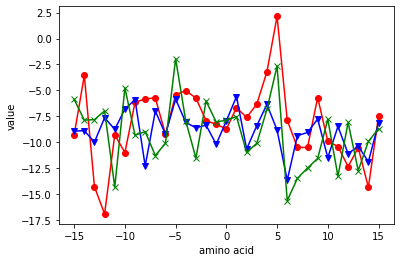

FASG760104


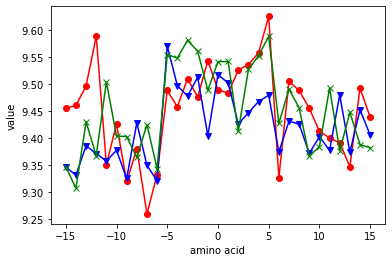

FASG760105


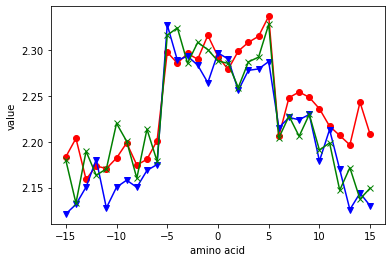

FAUJ830101


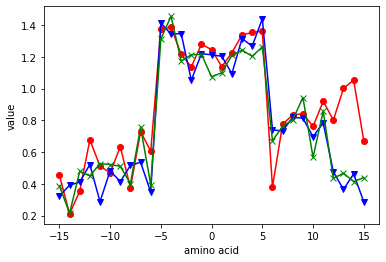

FAUJ880101


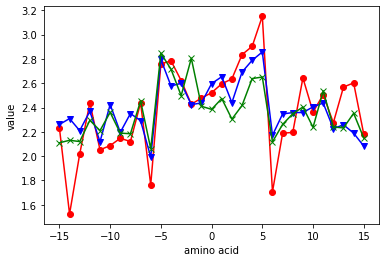

FAUJ880102


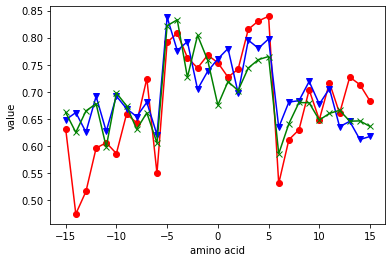

FAUJ880103


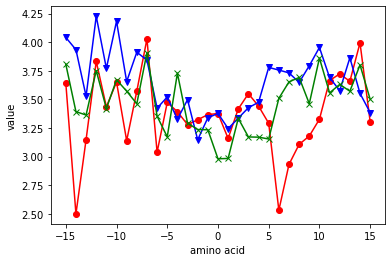

FAUJ880104


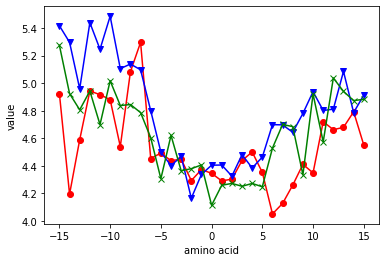

FAUJ880105


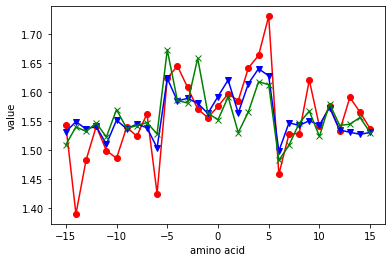

FAUJ880106


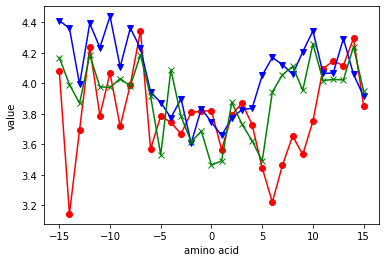

FAUJ880107


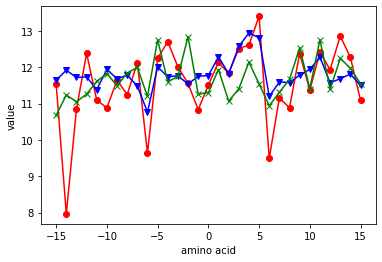

FAUJ880108


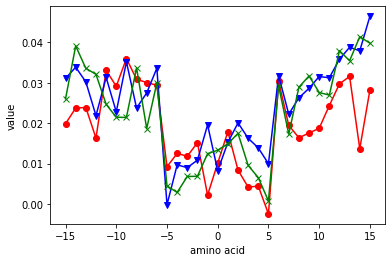

FAUJ880109


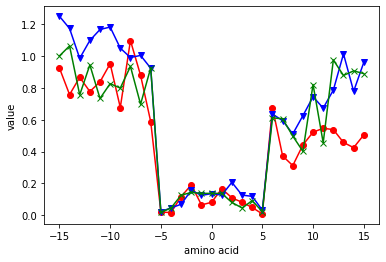

FAUJ880110


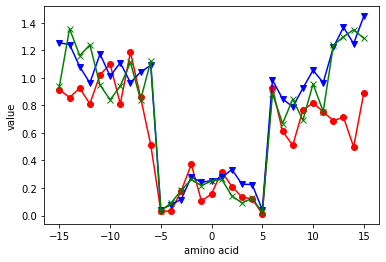

FAUJ880111


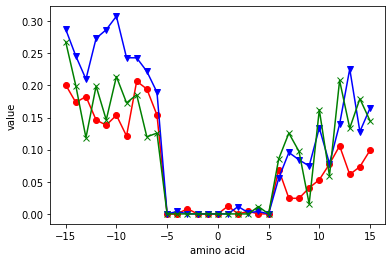

FAUJ880112


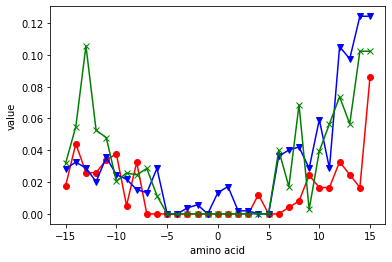

FAUJ880113


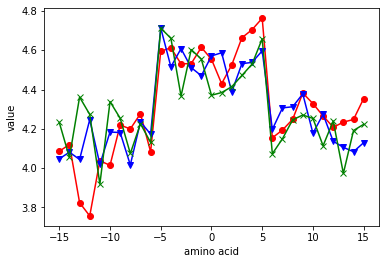

FINA770101


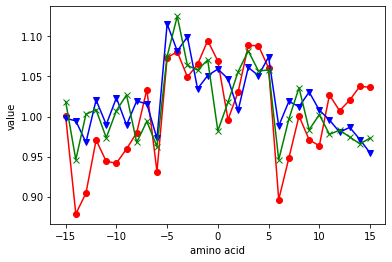

FINA910101


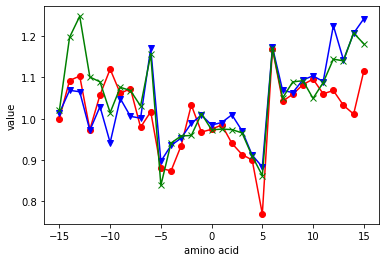

FINA910102


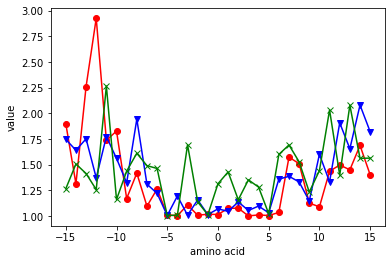

FINA910103


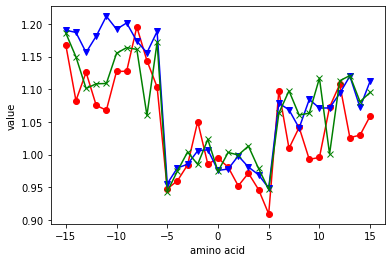

FINA910104


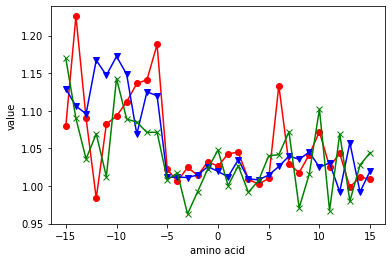

GARJ730101


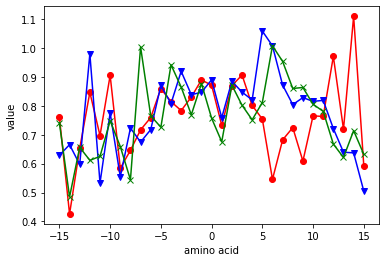

GEIM800101


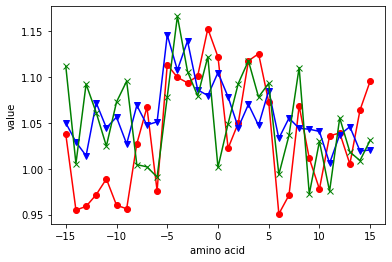

GEIM800102


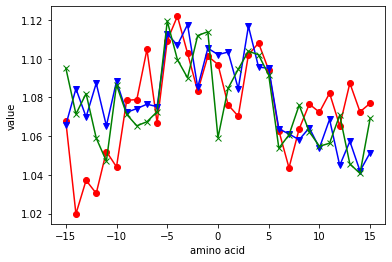

GEIM800103


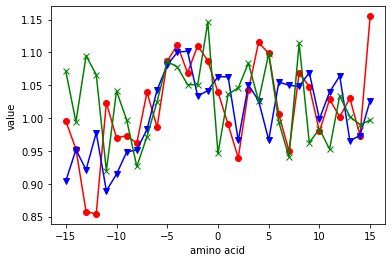

GEIM800104


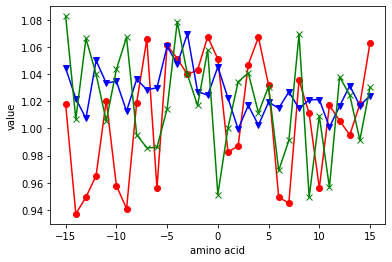

GEIM800105


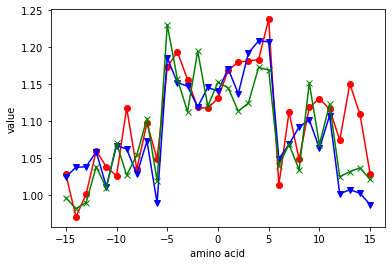

GEIM800106


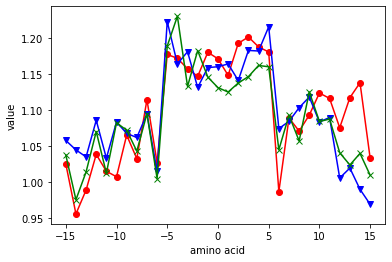

GEIM800107


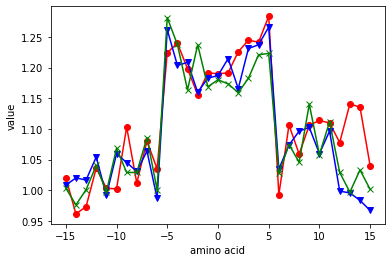

GEIM800108


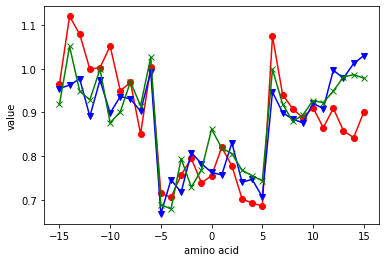

GEIM800109


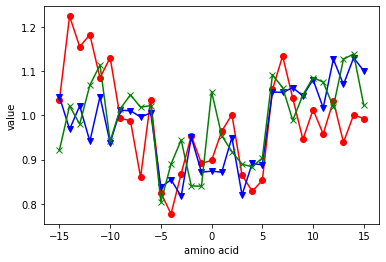

GEIM800110


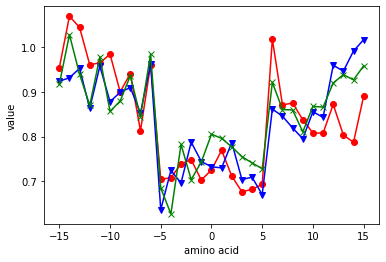

GEIM800111


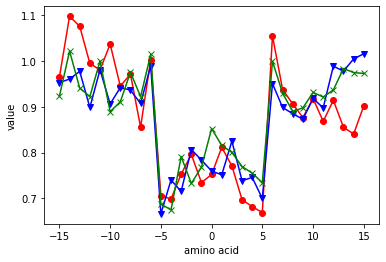

GOLD730101


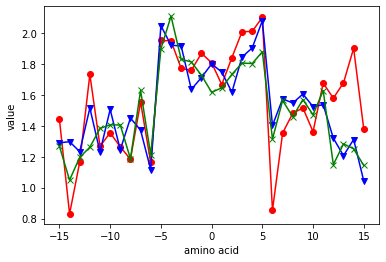

GOLD730102


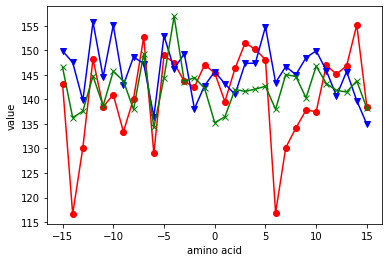

GRAR740101


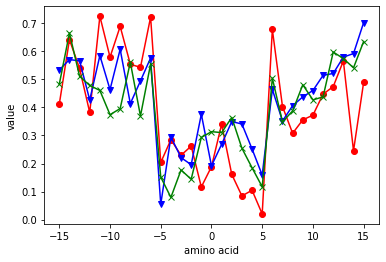

GRAR740102


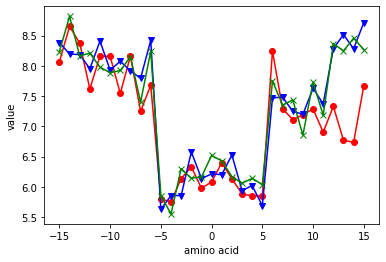

GRAR740103


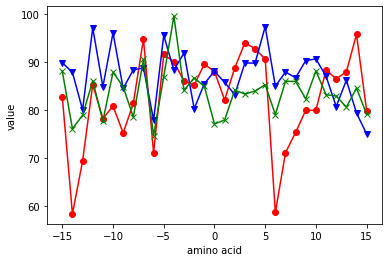

GUYH850101


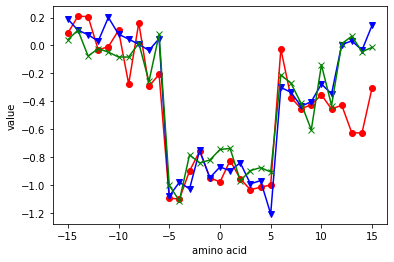

HOPA770101


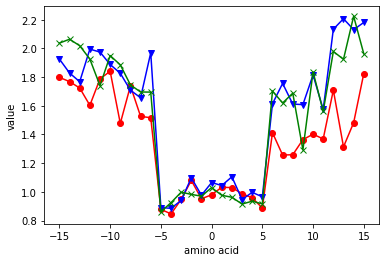

HOPT810101


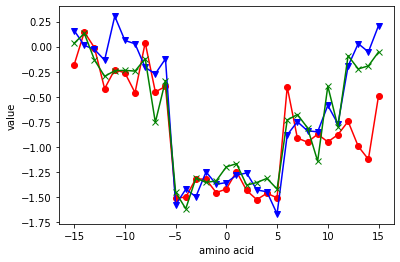

HUTJ700101


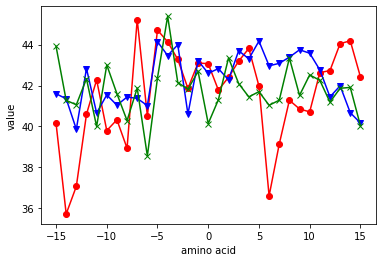

HUTJ700102


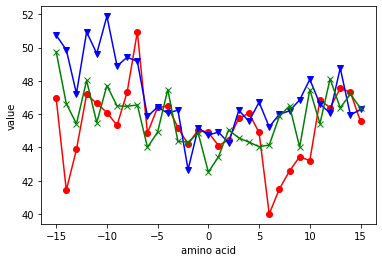

HUTJ700103


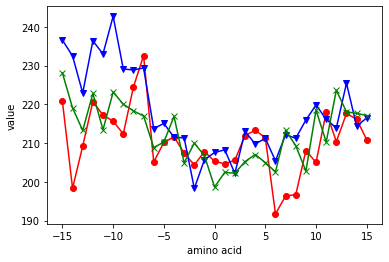

ISOY800101


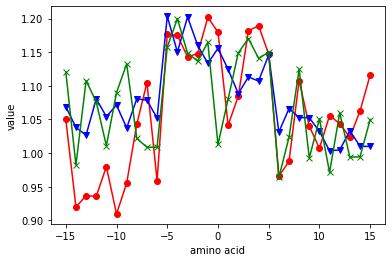

ISOY800102


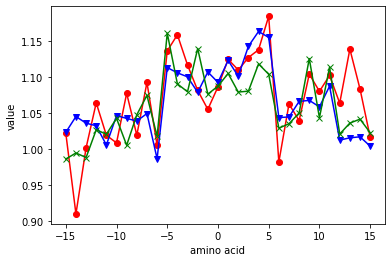

ISOY800103


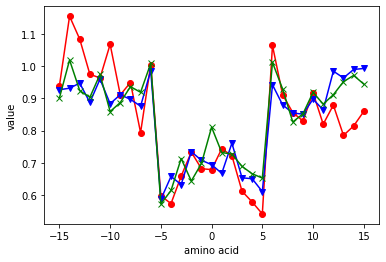

ISOY800104


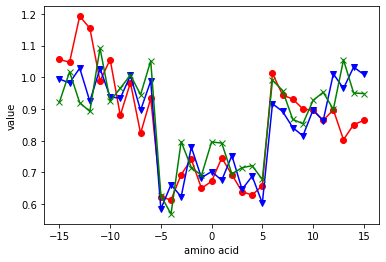

ISOY800105


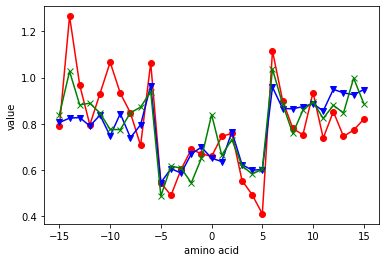

ISOY800106


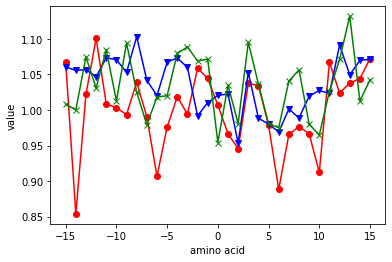

ISOY800107


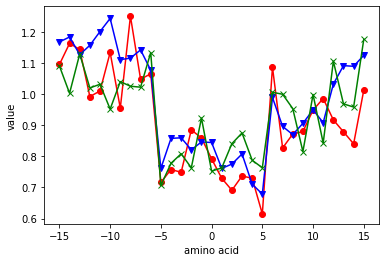

ISOY800108


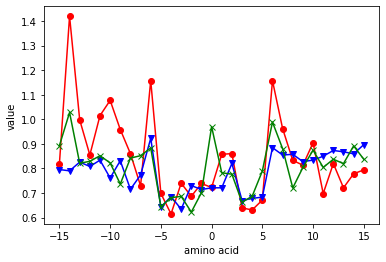

JANJ780101


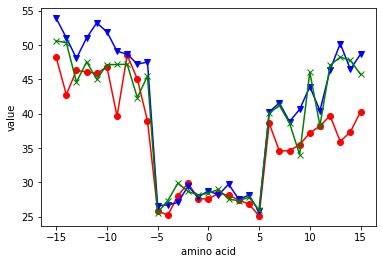

JANJ780102


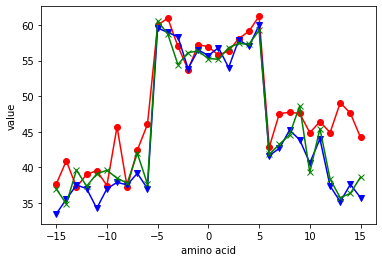

JANJ780103


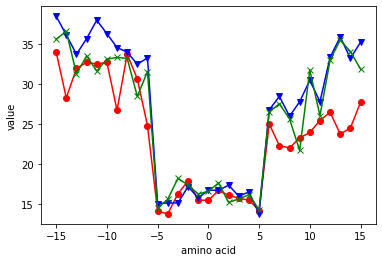

JANJ790101


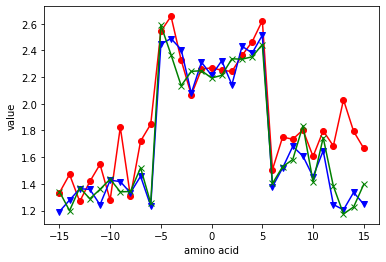

JANJ790102


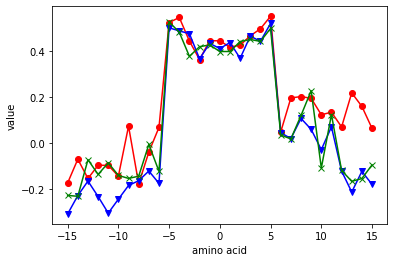

JOND750101


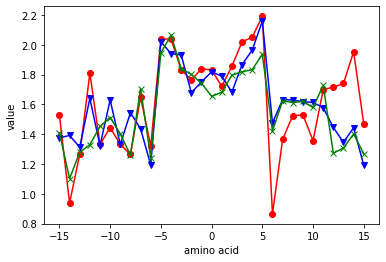

JOND750102


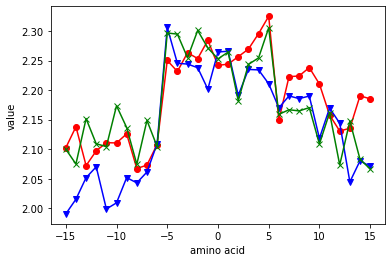

JOND920101


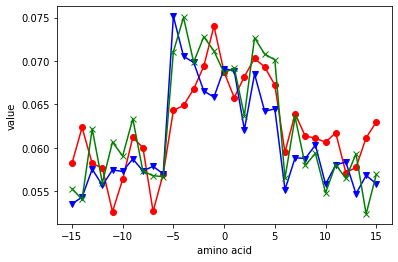

JOND920102


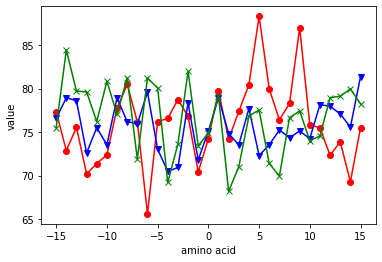

JUKT750101


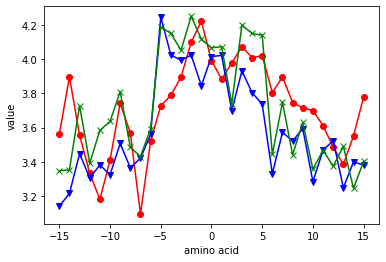

JUNJ780101


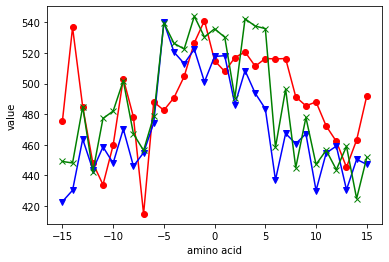

KANM800101


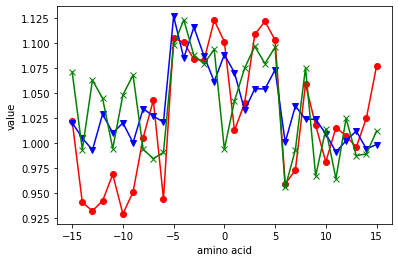

KANM800102


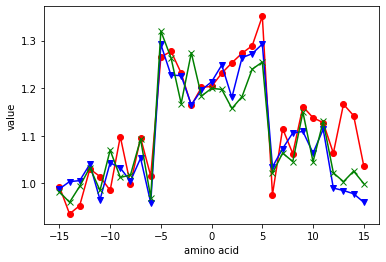

KANM800103


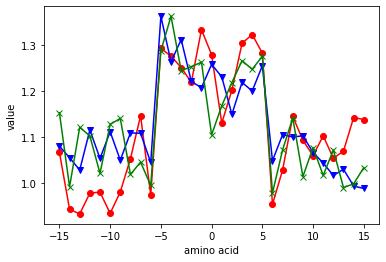

KANM800104


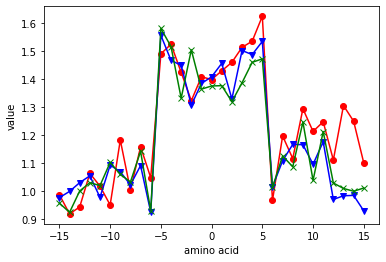

KARP850101


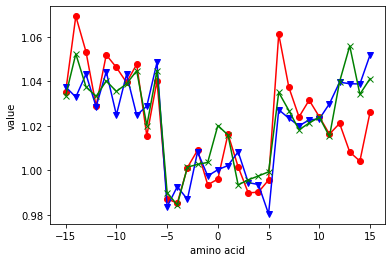

KARP850102


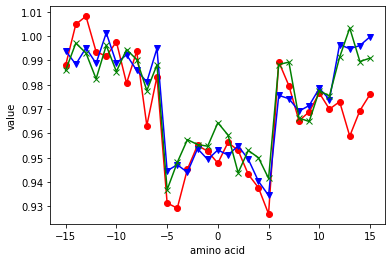

KARP850103


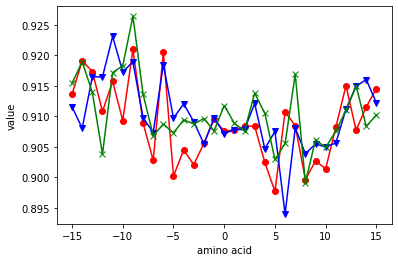

KHAG800101


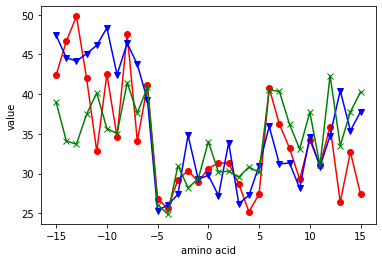

KLEP840101


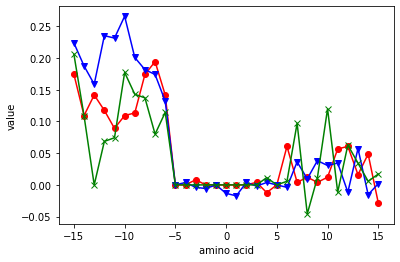

KRIW710101


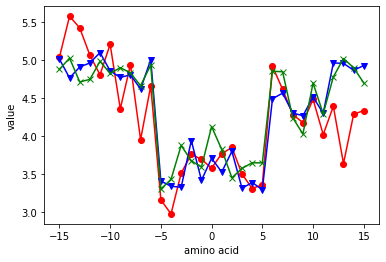

KRIW790101


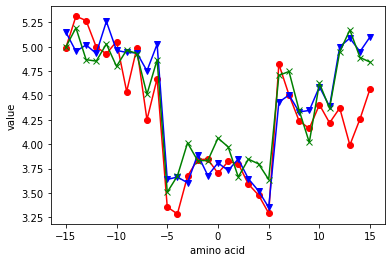

KRIW790102


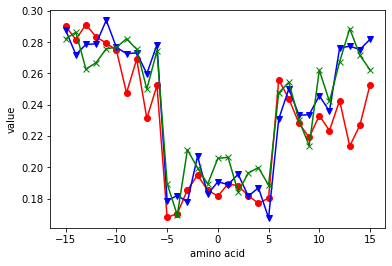

KRIW790103


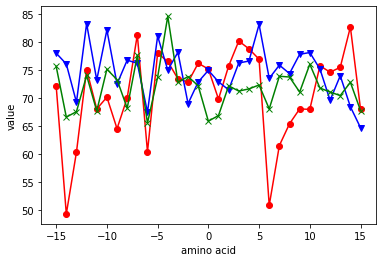

KYTJ820101


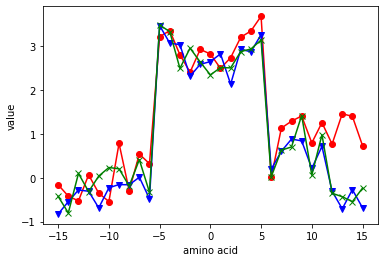

LAWE840101


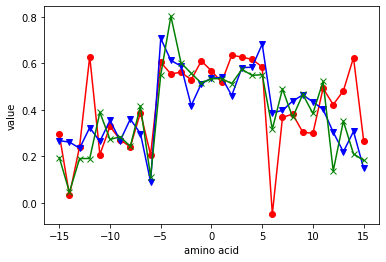

LEVM760101


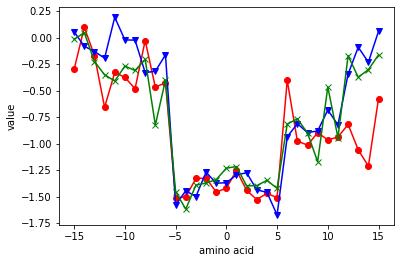

LEVM760102


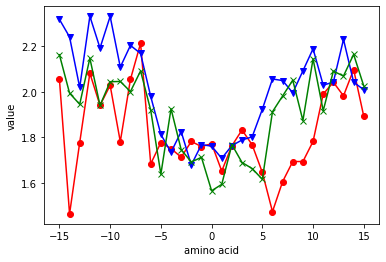

LEVM760103


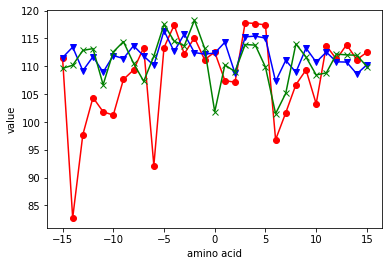

LEVM760104


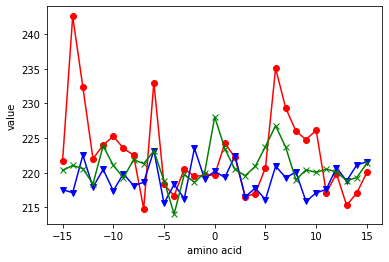

LEVM760105


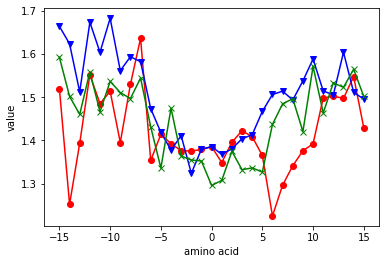

LEVM760106


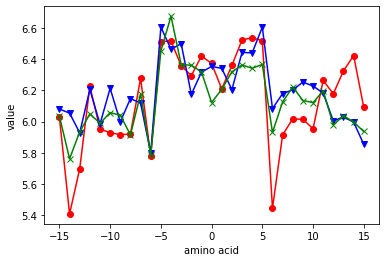

LEVM760107


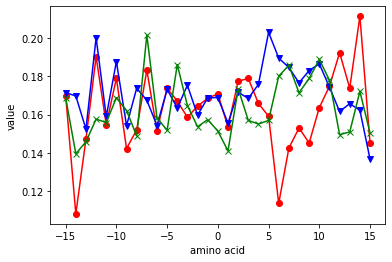

LEVM780101


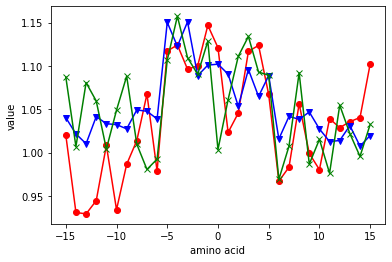

LEVM780102


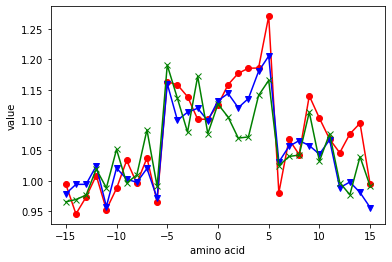

LEVM780103


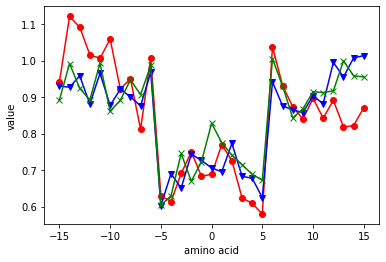

LEVM780104


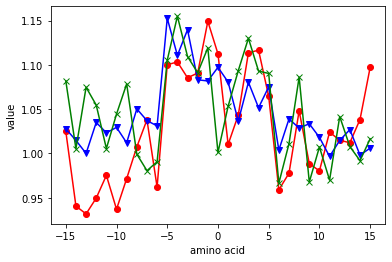

LEVM780105


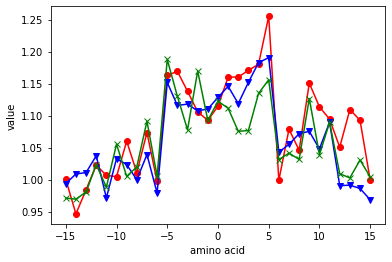

LEVM780106


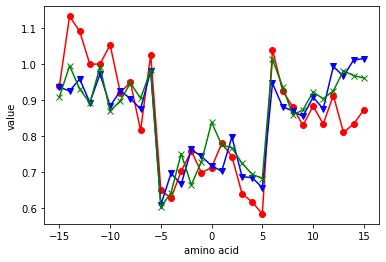

LEWP710101


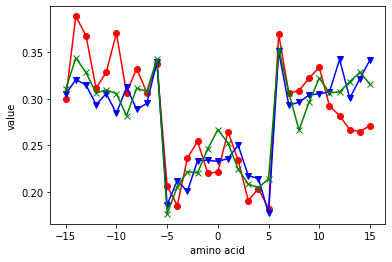

LIFS790101


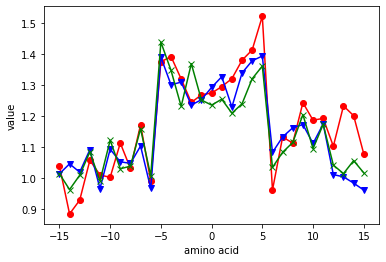

LIFS790102


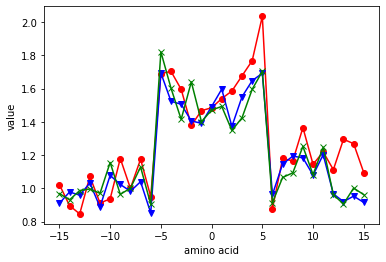

LIFS790103


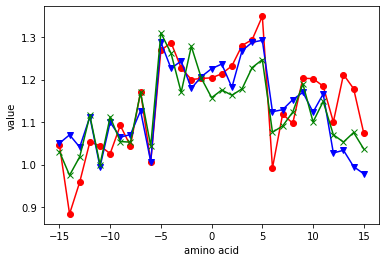

MANP780101


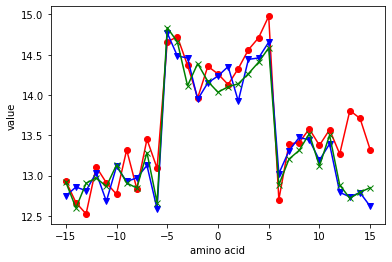

MAXF760101


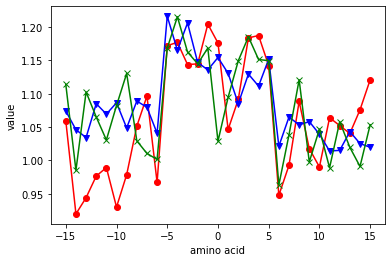

MAXF760102


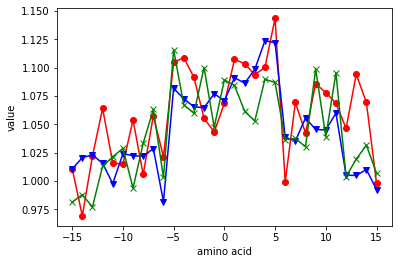

MAXF760103


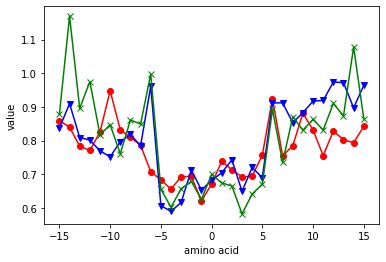

MAXF760104


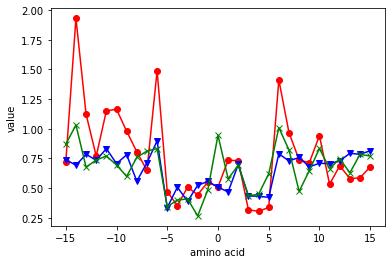

MAXF760105


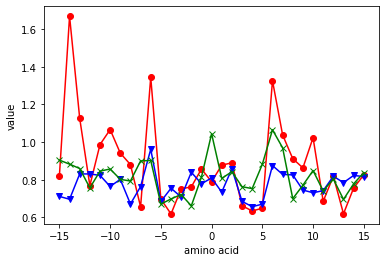

MAXF760106


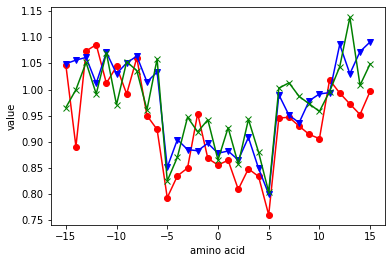

MCMT640101


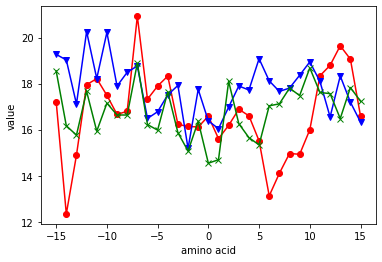

MEEJ800101


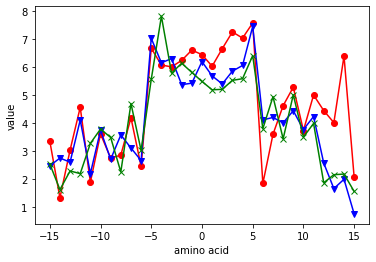

MEEJ800102


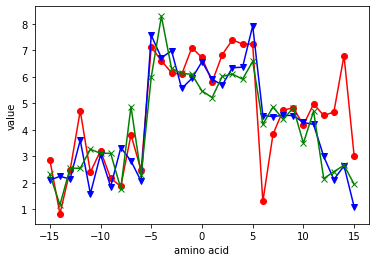

MEEJ810101


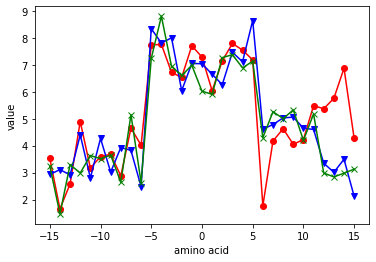

MEEJ810102


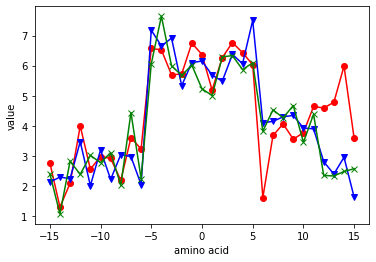

MEIH800101


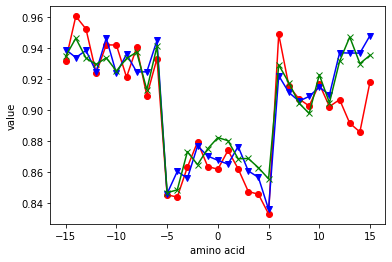

MEIH800102


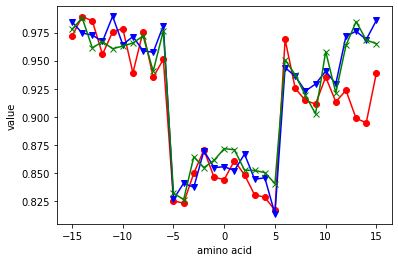

MEIH800103


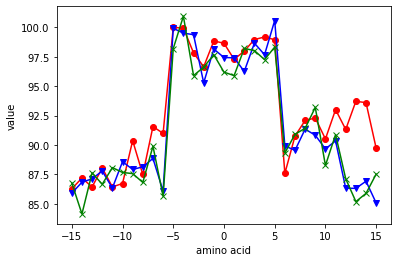

MIYS850101


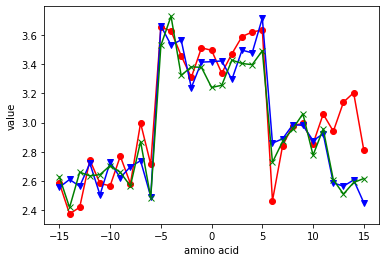

NAGK730101


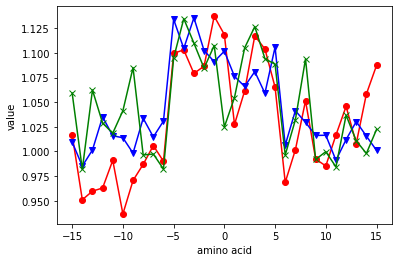

NAGK730102


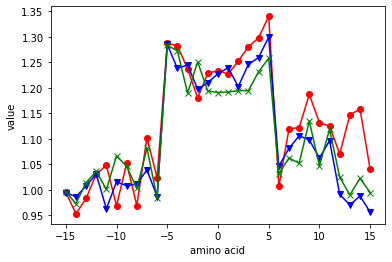

NAGK730103


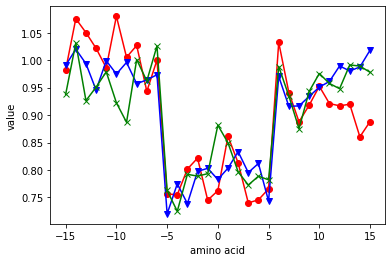

NAKH900101


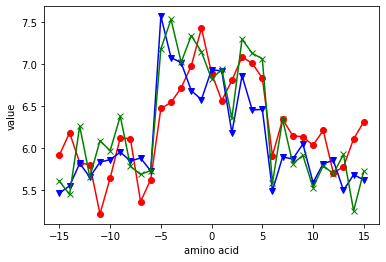

NAKH900102


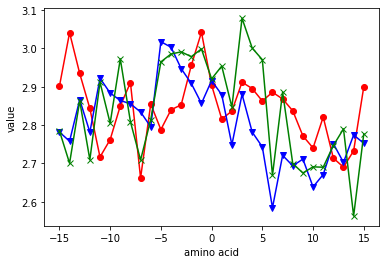

NAKH900103


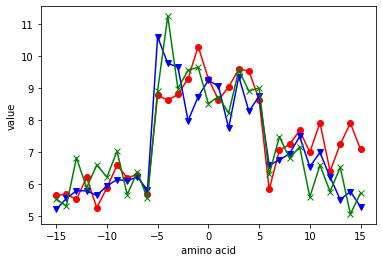

NAKH900104


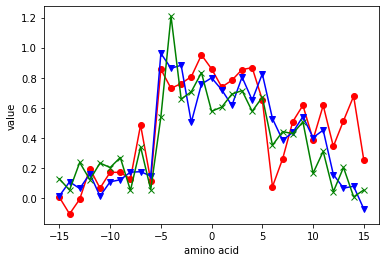

NAKH900105


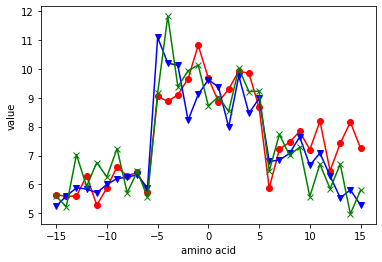

NAKH900106


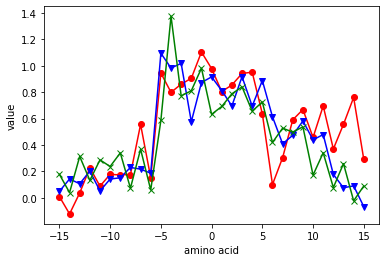

NAKH900107


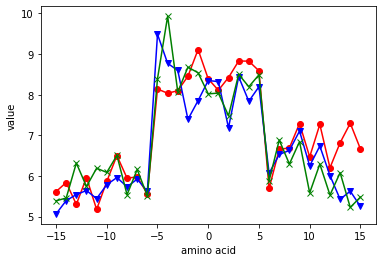

NAKH900108


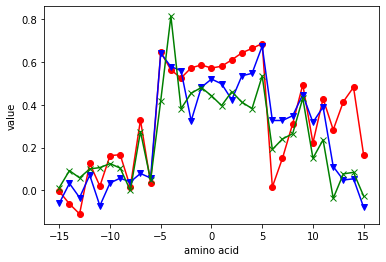

NAKH900109


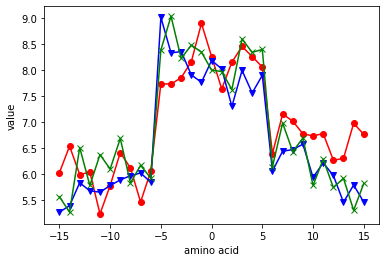

NAKH900110


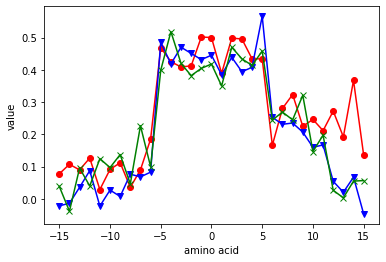

NAKH900111


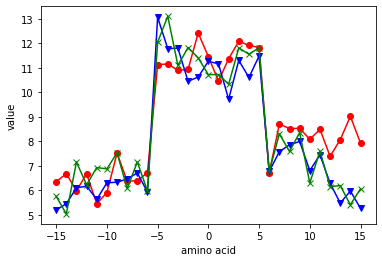

NAKH900112


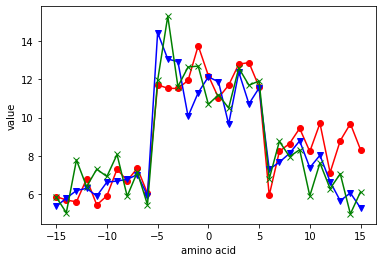

NAKH900113


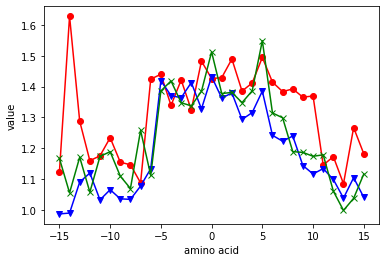

NAKH920101


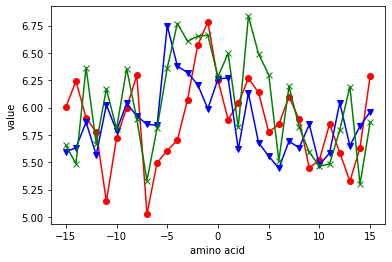

NAKH920102


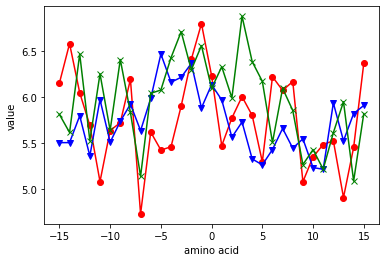

NAKH920103


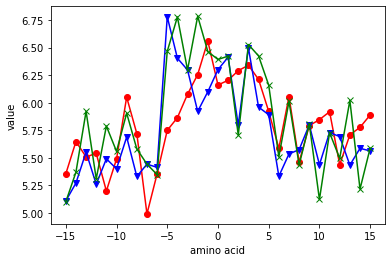

NAKH920104


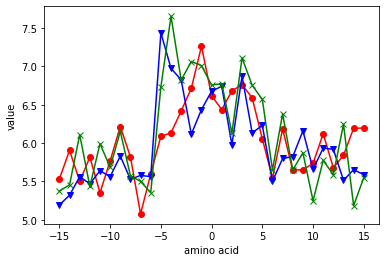

NAKH920105


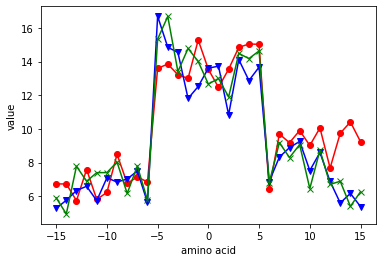

NAKH920106


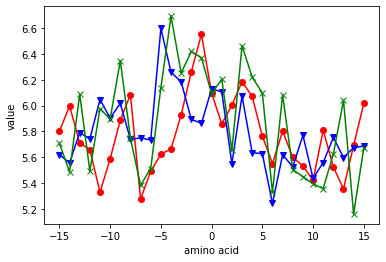

NAKH920107


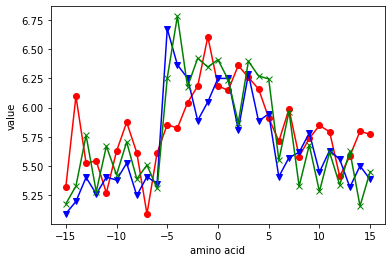

NAKH920108


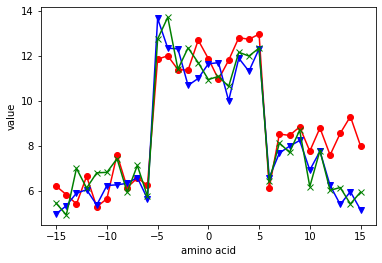

NISK800101


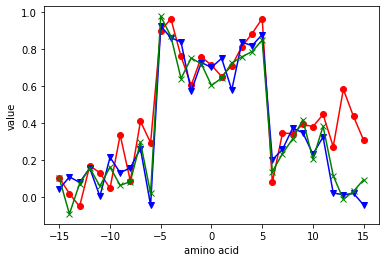

NISK860101


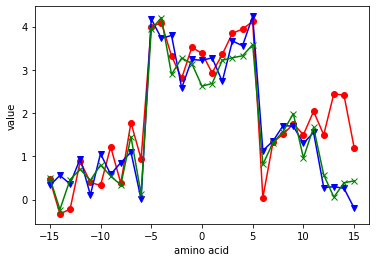

NOZY710101


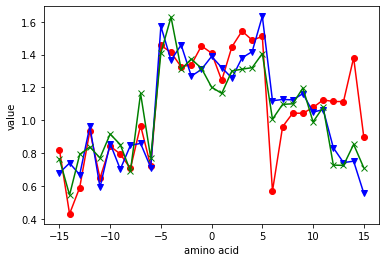

OOBM770101


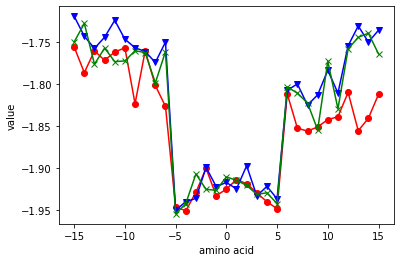

OOBM770102


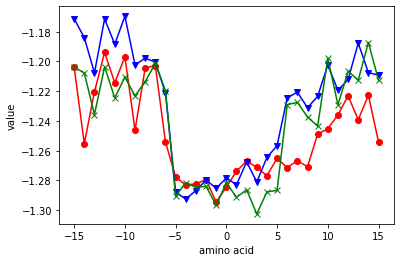

OOBM770103


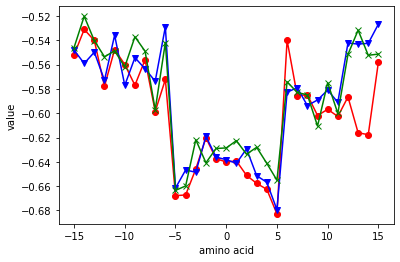

OOBM770104


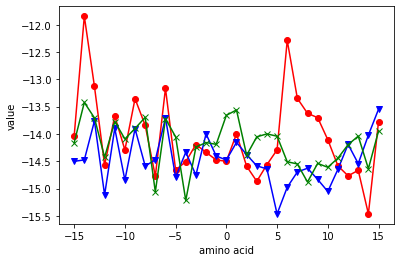

OOBM770105


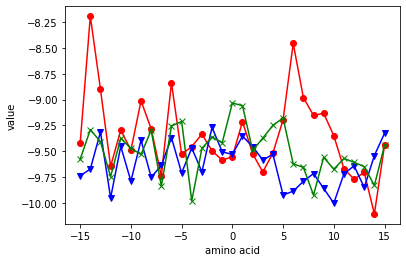

OOBM850101


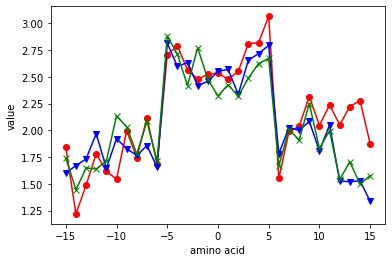

OOBM850102


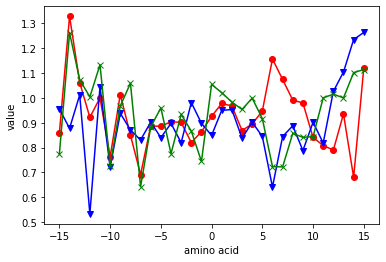

OOBM850103


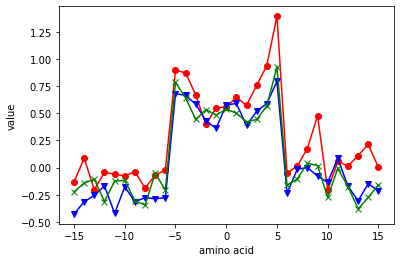

OOBM850104


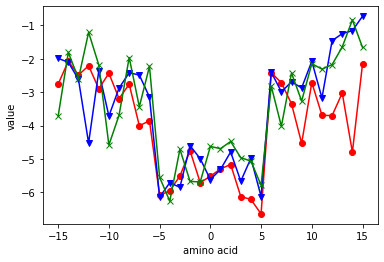

OOBM850105


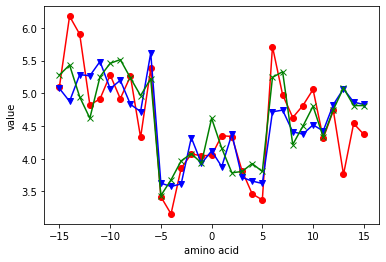

PALJ810101


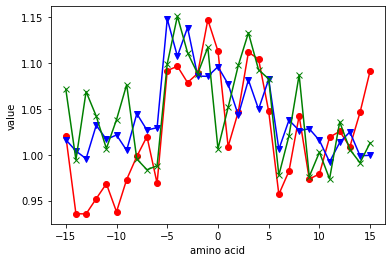

PALJ810102


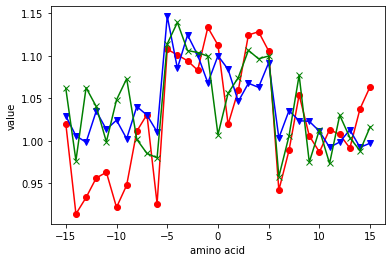

PALJ810103


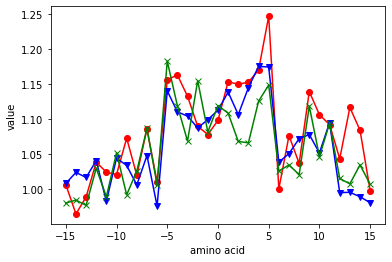

PALJ810104


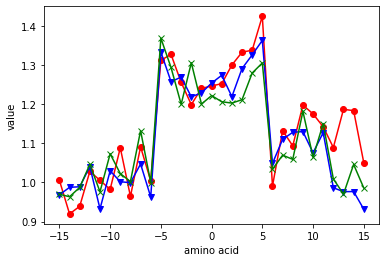

PALJ810105


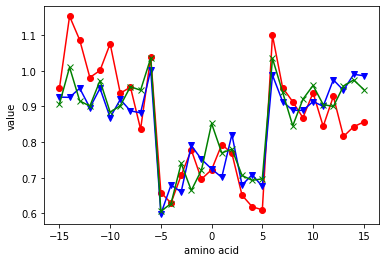

PALJ810106


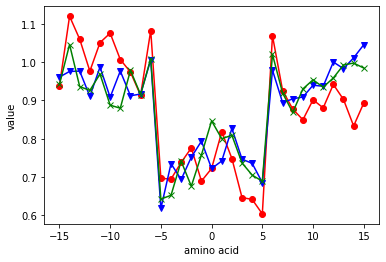

PALJ810107


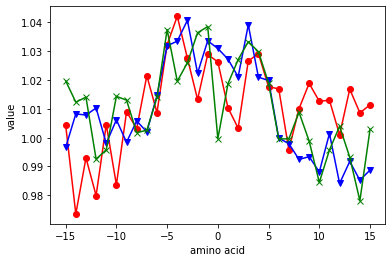

PALJ810108


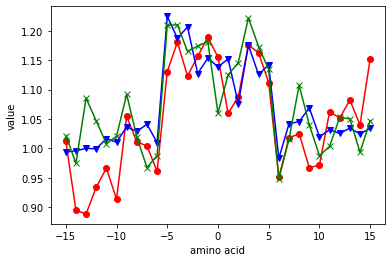

PALJ810109


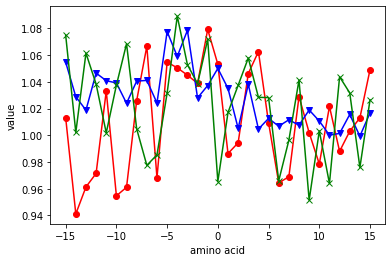

PALJ810110


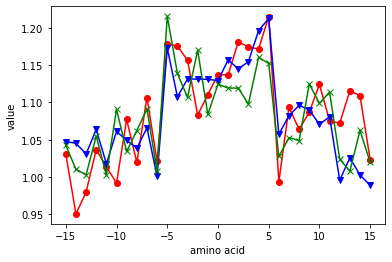

PALJ810111


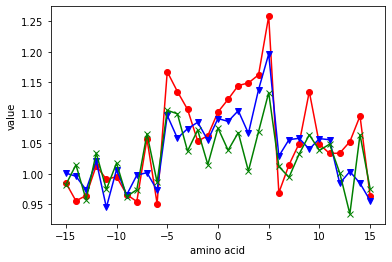

PALJ810112


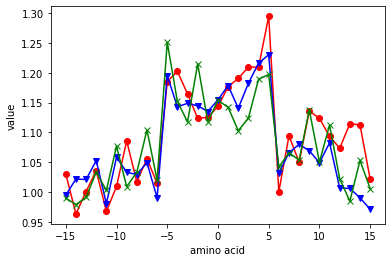

PALJ810113


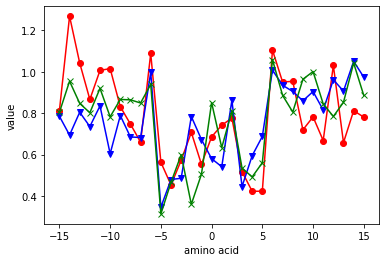

PALJ810114


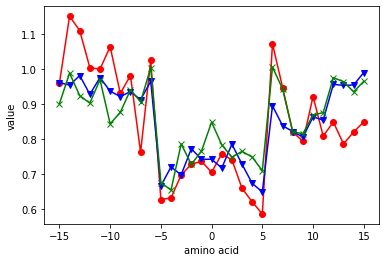

PALJ810115


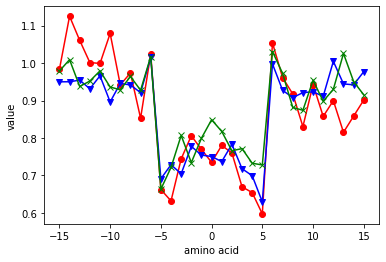

PALJ810116


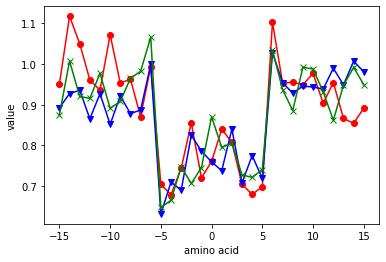

PARJ860101


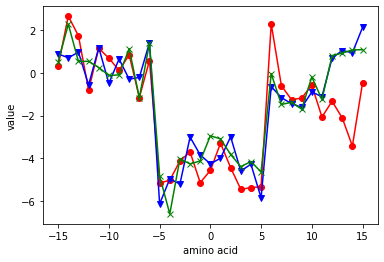

PLIV810101


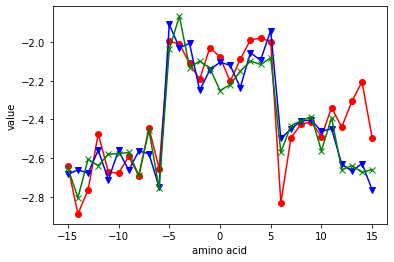

PONP800101


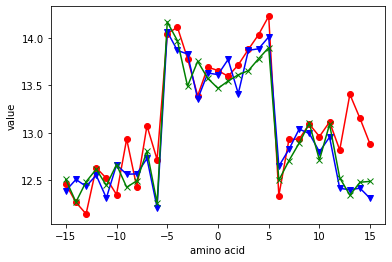

PONP800102


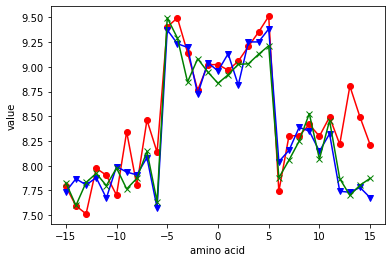

PONP800103


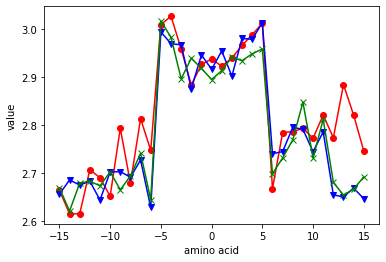

PONP800104


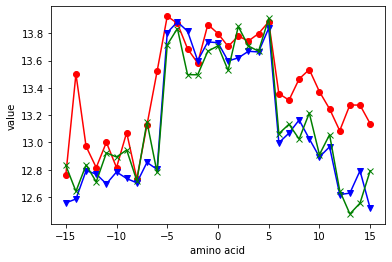

PONP800105


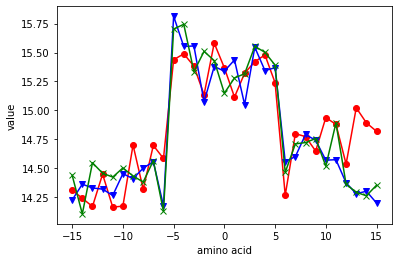

PONP800106


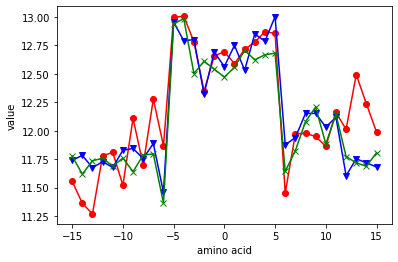

PONP800107


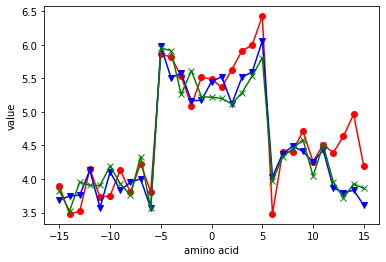

PONP800108


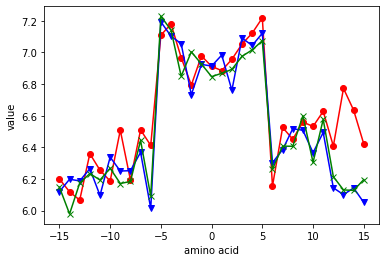

PRAM820101


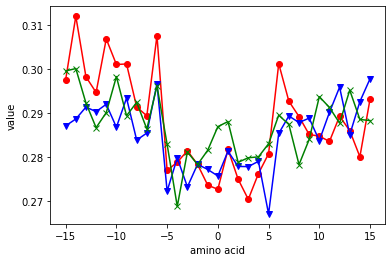

PRAM820102


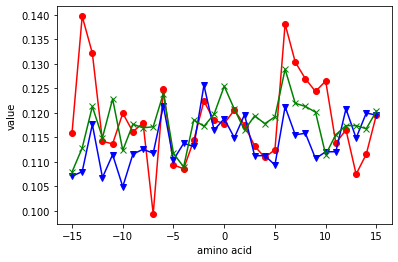

PRAM820103


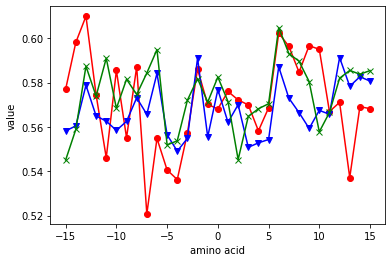

PRAM900101


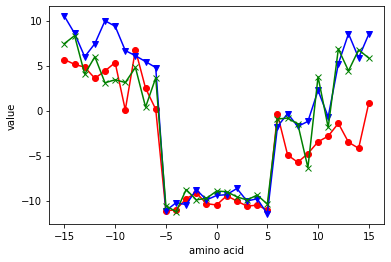

PRAM900102


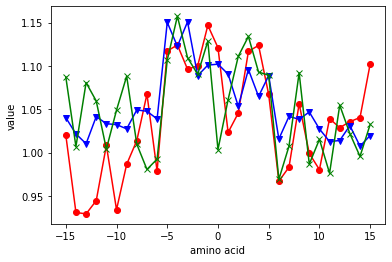

PRAM900103


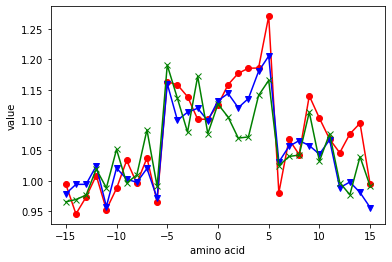

PRAM900104


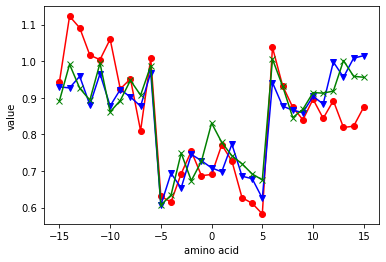

PTIO830101


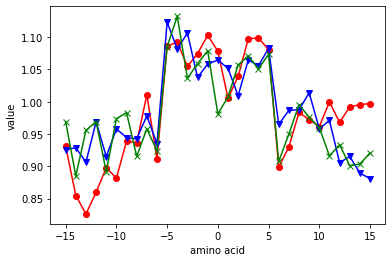

PTIO830102


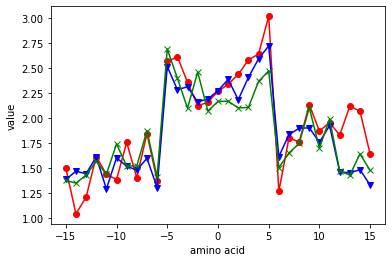

QIAN880101


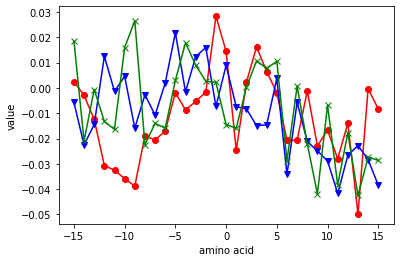

QIAN880102


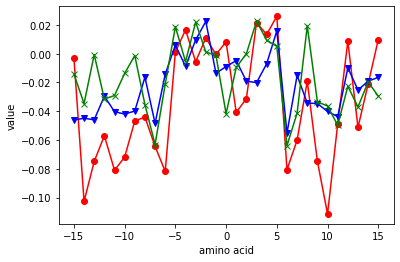

QIAN880103


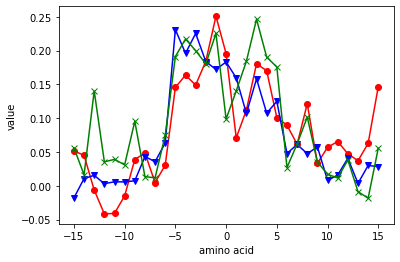

QIAN880104


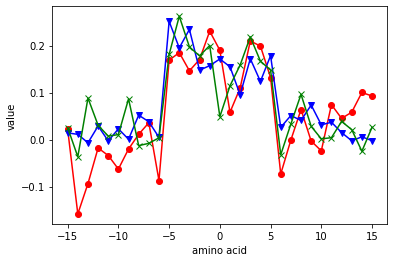

QIAN880105


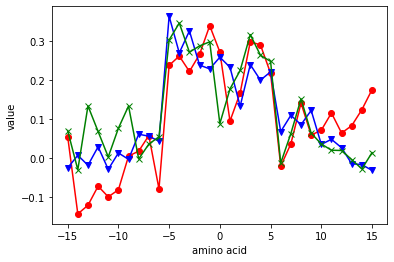

QIAN880106


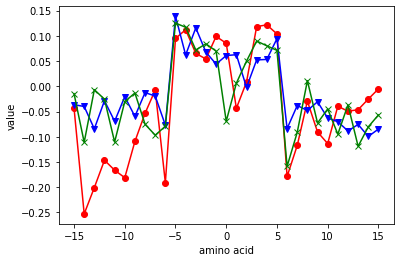

QIAN880107


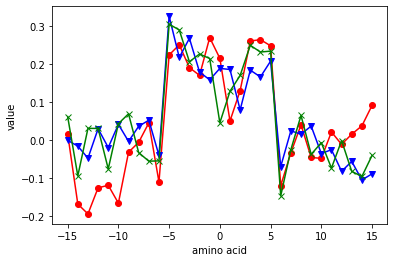

QIAN880108


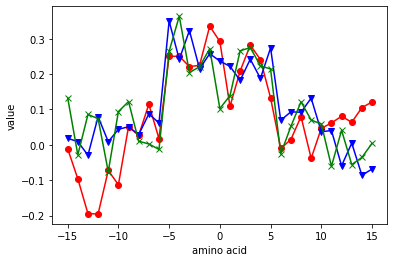

QIAN880109


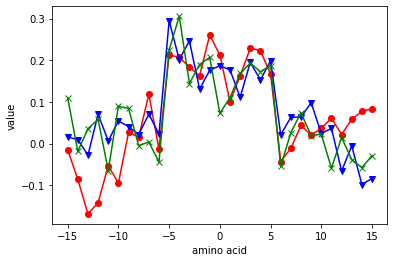

QIAN880110


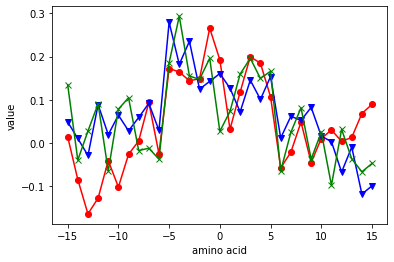

QIAN880111


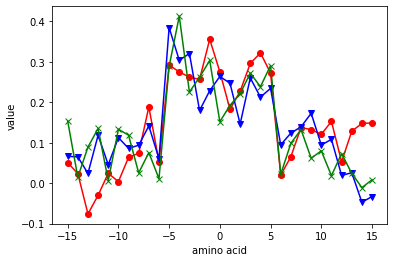

QIAN880112


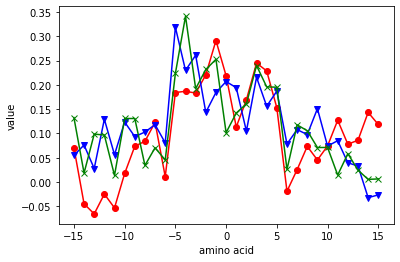

QIAN880113


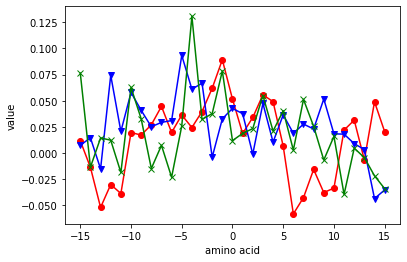

QIAN880114


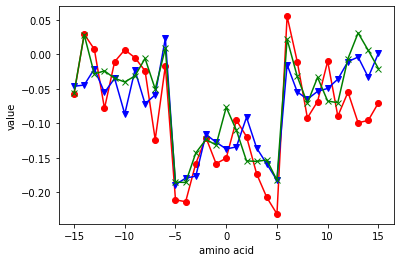

QIAN880115


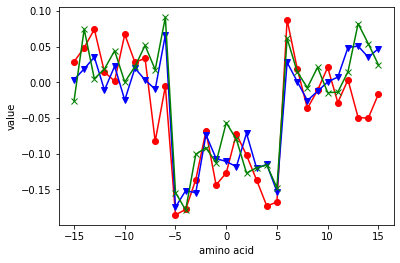

QIAN880116


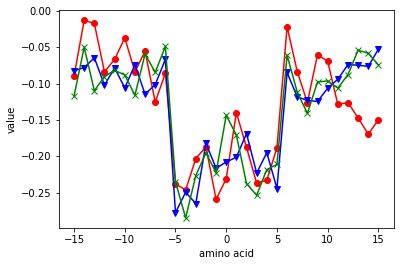

QIAN880117


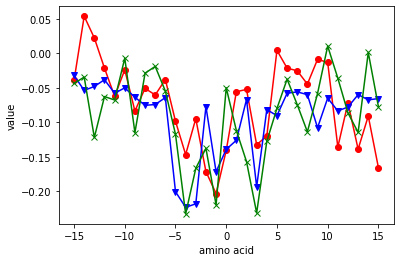

QIAN880118


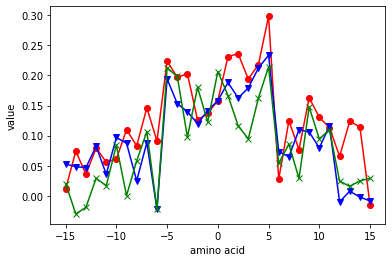

QIAN880119


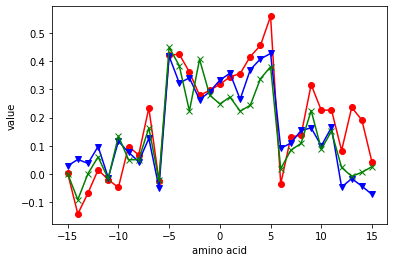

QIAN880120


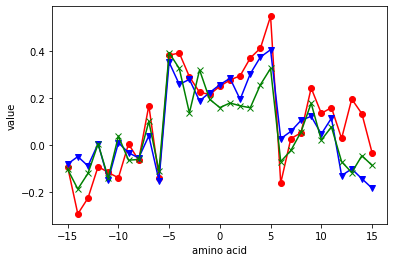

QIAN880121


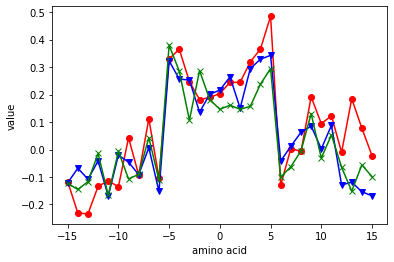

QIAN880122


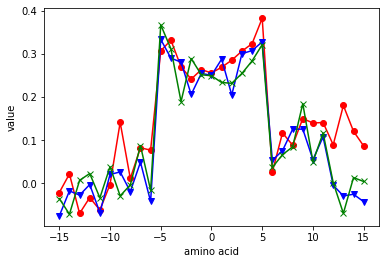

QIAN880123


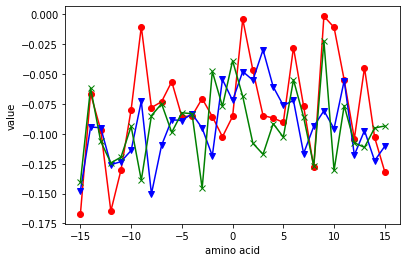

QIAN880124


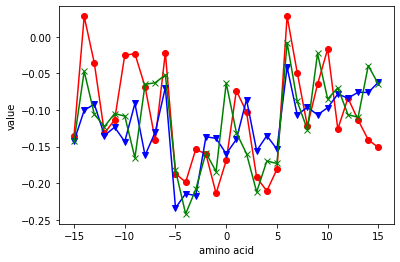

QIAN880125


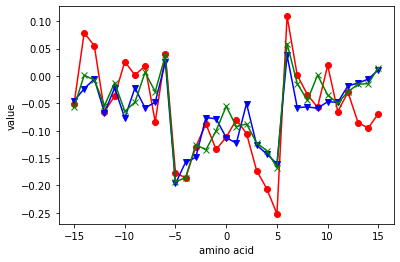

QIAN880126


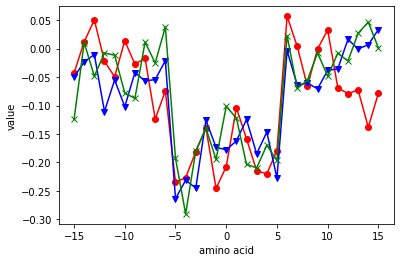

QIAN880127


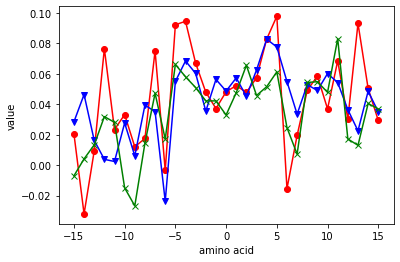

QIAN880128


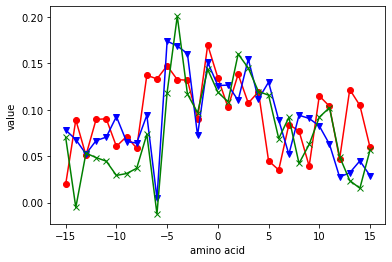

QIAN880129


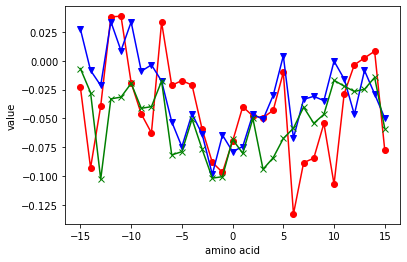

QIAN880130


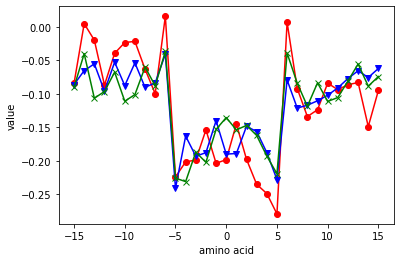

QIAN880131


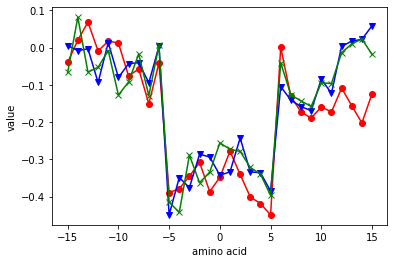

QIAN880132


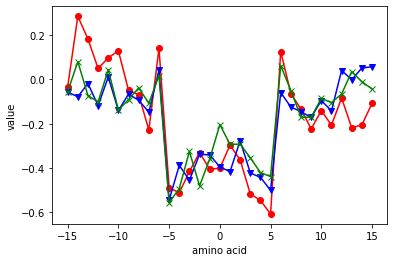

QIAN880133


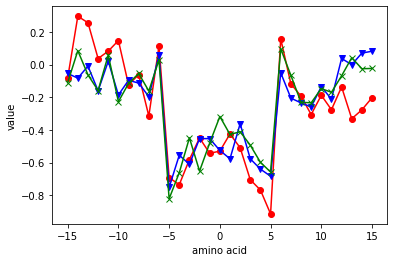

QIAN880134


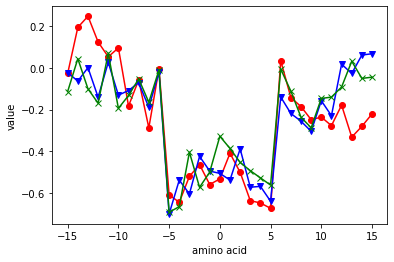

QIAN880135


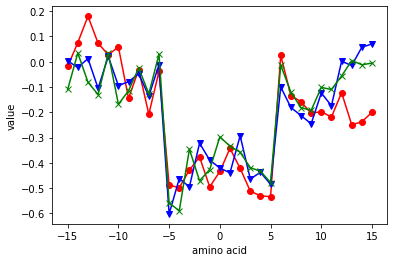

QIAN880136


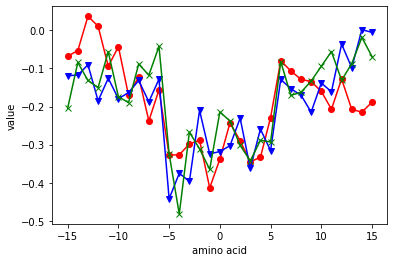

QIAN880137


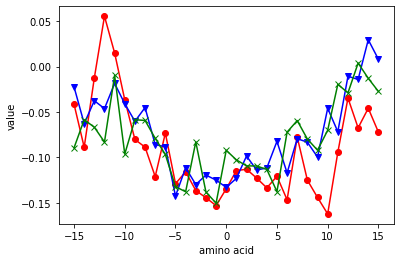

QIAN880138


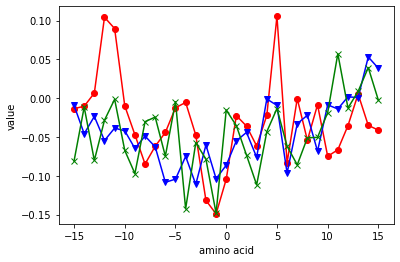

QIAN880139


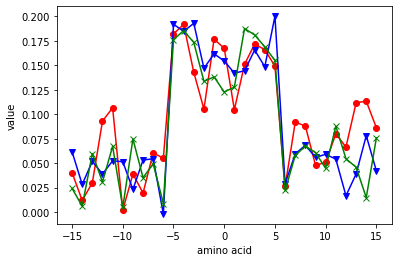

RACS770101


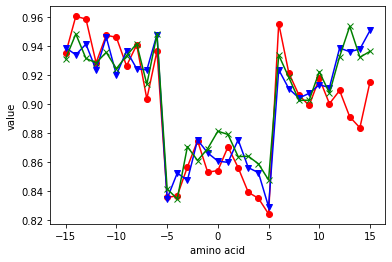

RACS770102


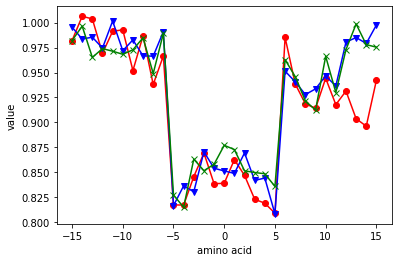

RACS770103


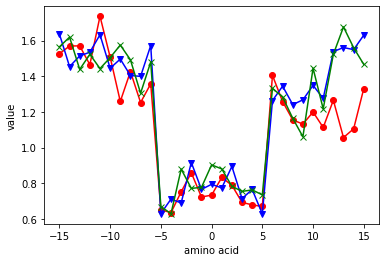

RACS820101


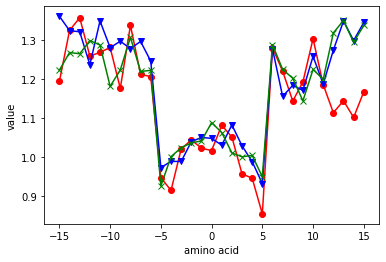

RACS820102


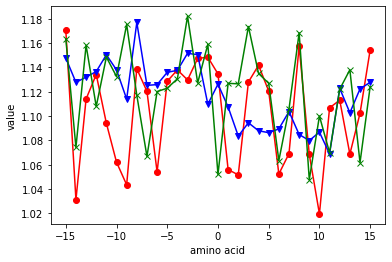

RACS820103


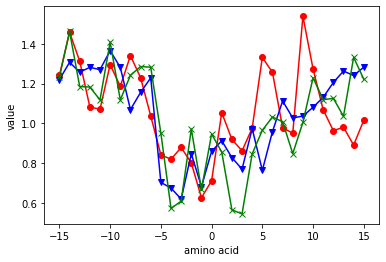

RACS820104


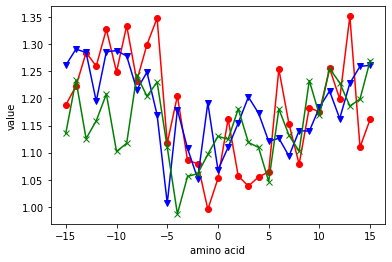

RACS820105


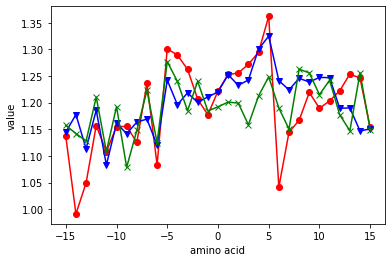

RACS820106


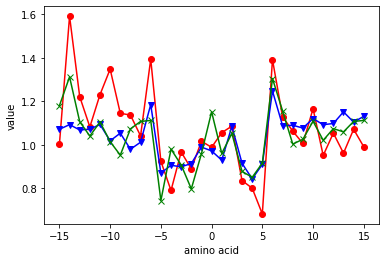

RACS820107


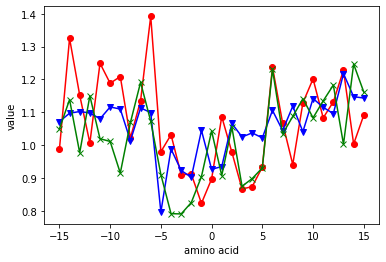

RACS820108


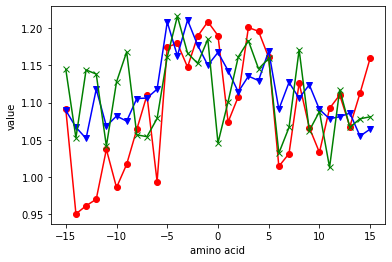

RACS820109


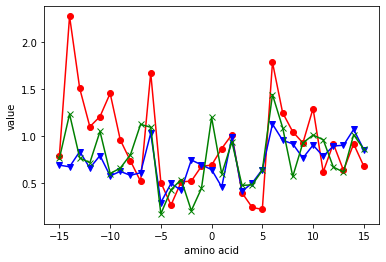

RACS820110


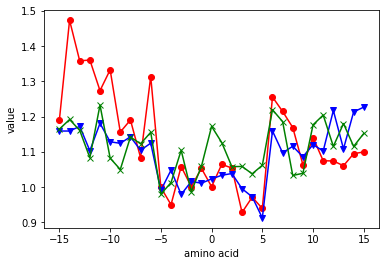

RACS820111


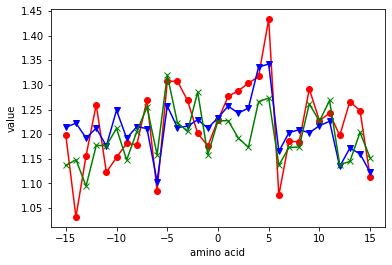

RACS820112


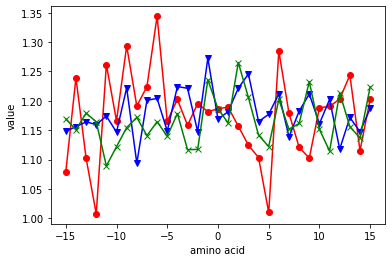

RACS820113


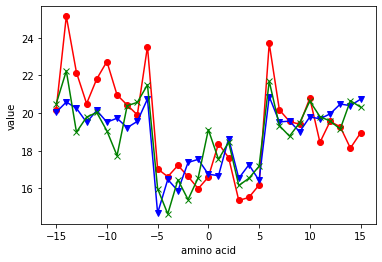

RACS820114


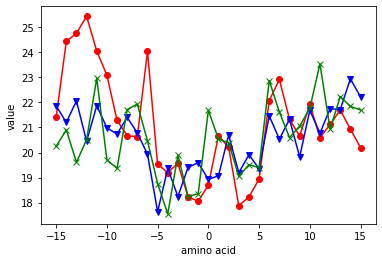

RADA880101


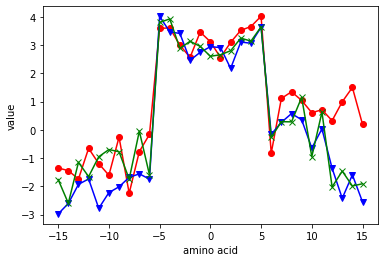

RADA880102


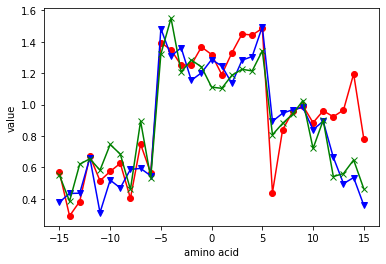

RADA880103


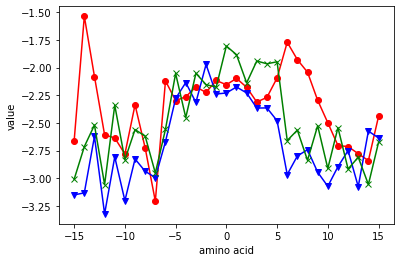

RADA880104


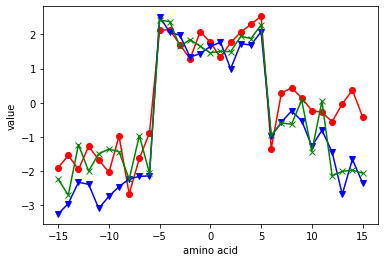

RADA880105


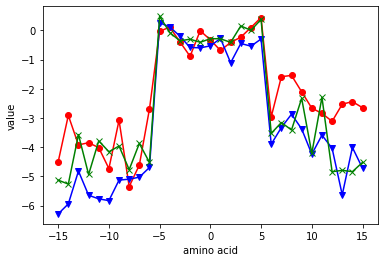

RADA880106


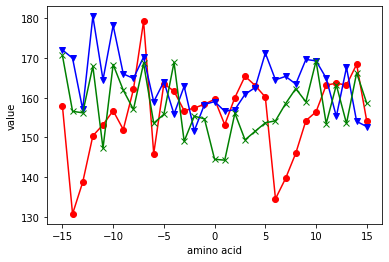

RADA880107


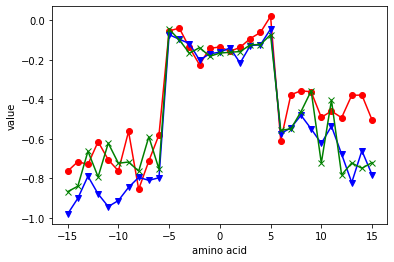

RADA880108


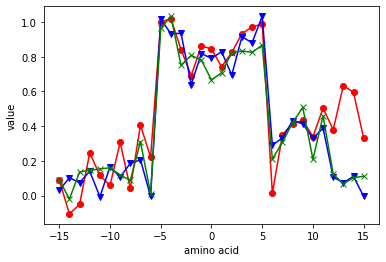

RICJ880101


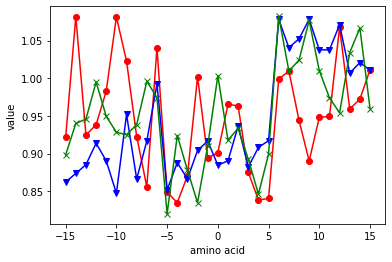

RICJ880102


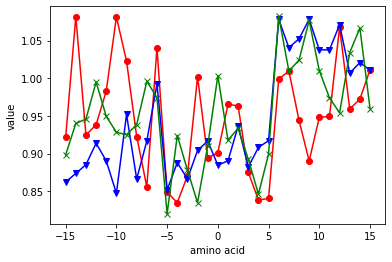

RICJ880103


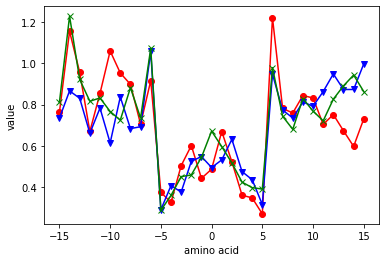

RICJ880104


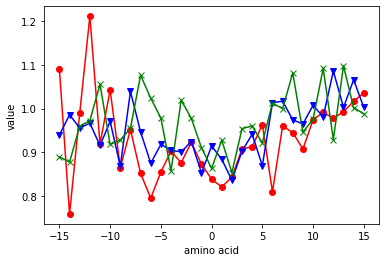

RICJ880105


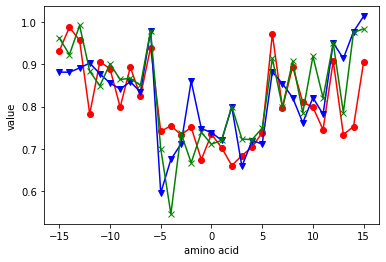

RICJ880106


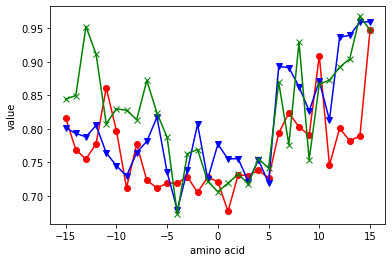

RICJ880107


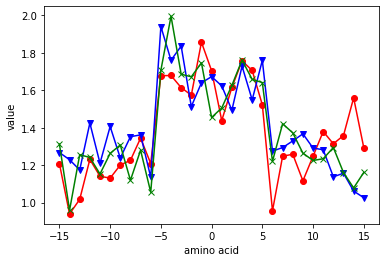

RICJ880108


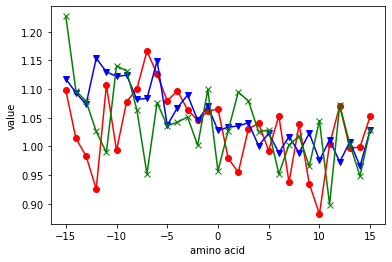

RICJ880109


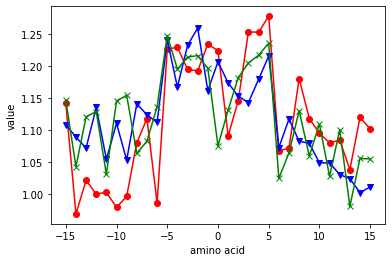

RICJ880110


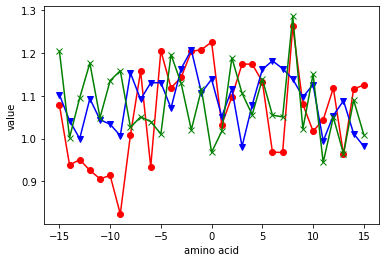

RICJ880111


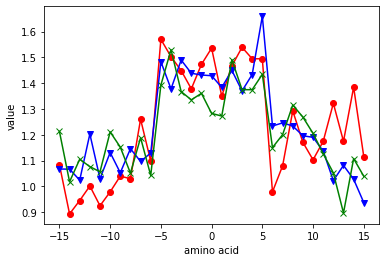

RICJ880112


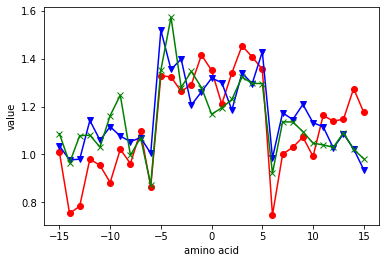

RICJ880113


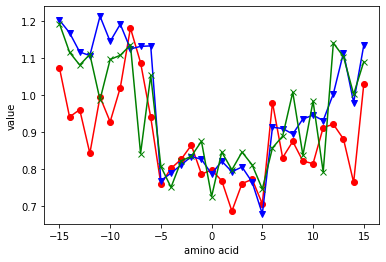

RICJ880114


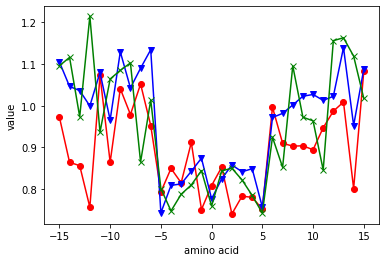

RICJ880115


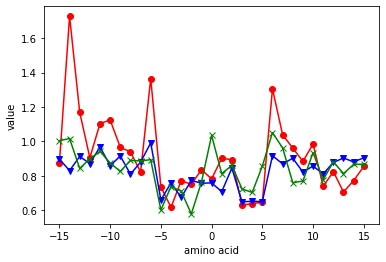

RICJ880116


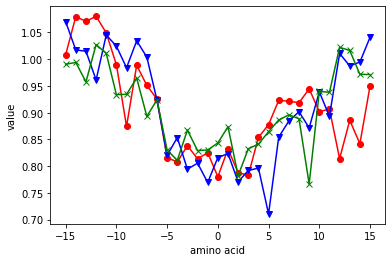

RICJ880117


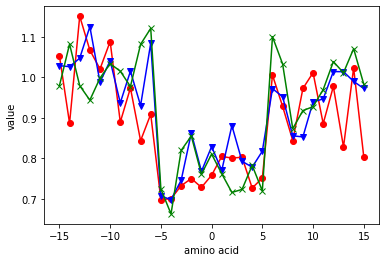

ROBB760101


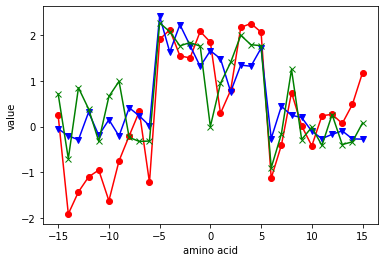

ROBB760102


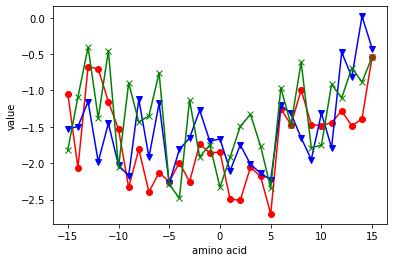

ROBB760103


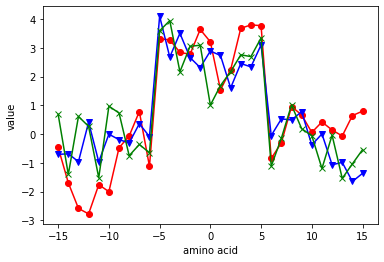

ROBB760104


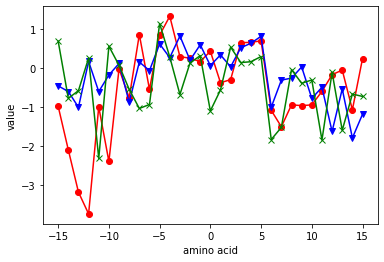

ROBB760105


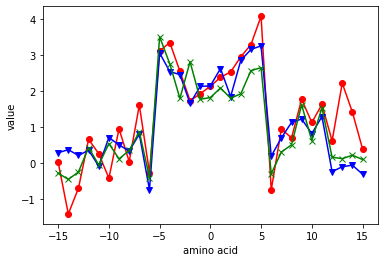

ROBB760106


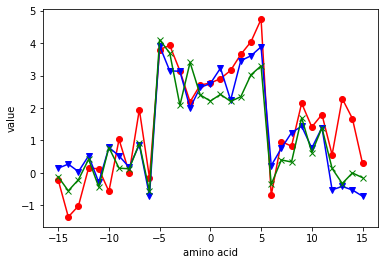

ROBB760107


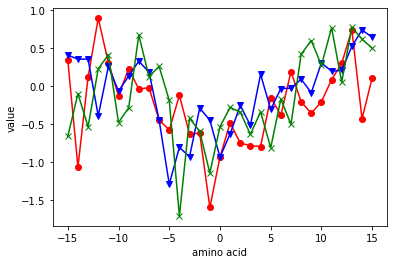

ROBB760108


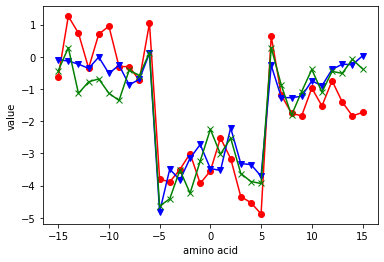

ROBB760109


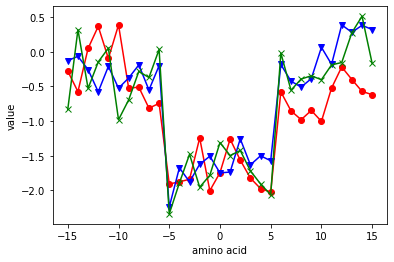

ROBB760110


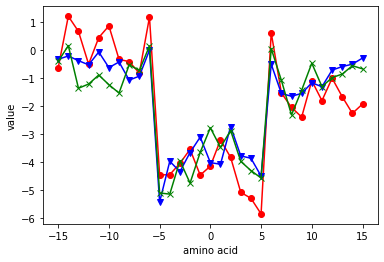

ROBB760111


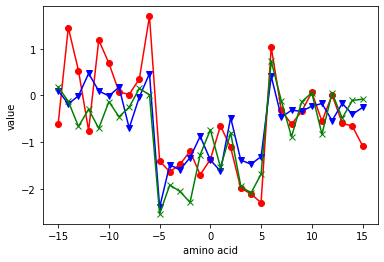

ROBB760112


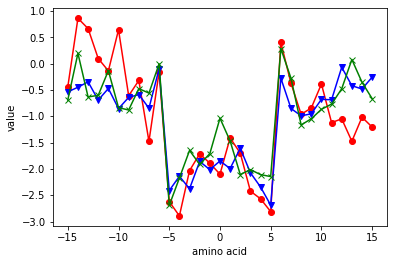

ROBB760113


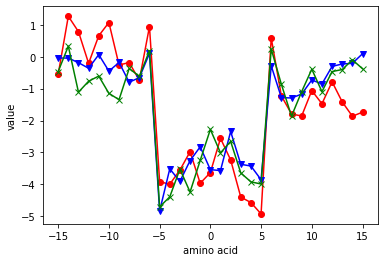

ROBB790101


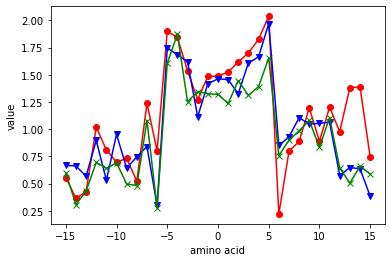

ROSG850101


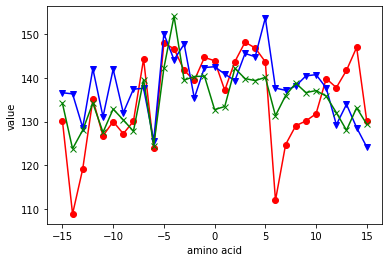

ROSG850102


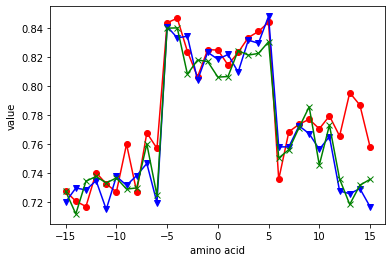

ROSM880101


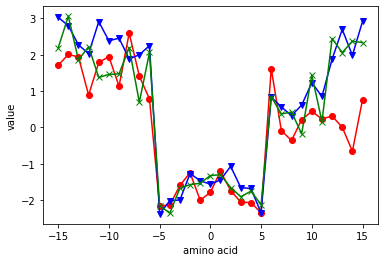

ROSM880102


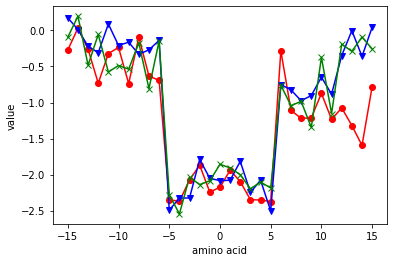

ROSM880103


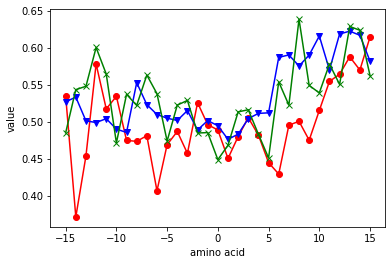

SIMZ760101


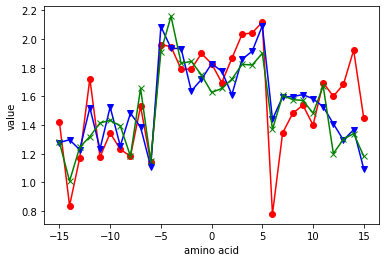

SNEP660101


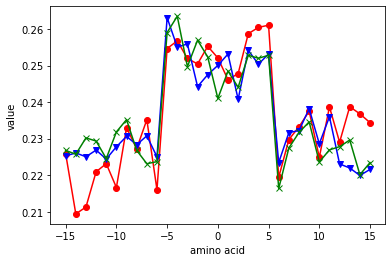

SNEP660102


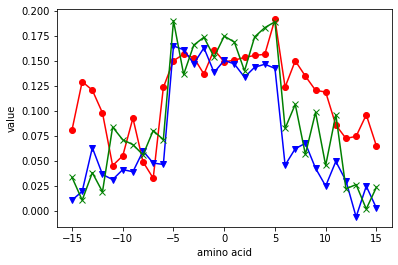

SNEP660103


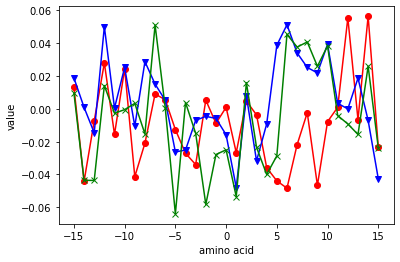

SNEP660104


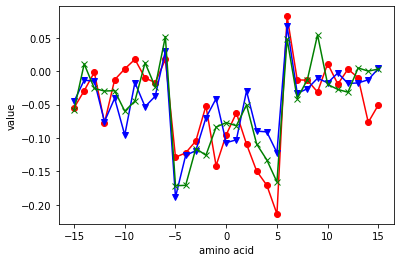

SUEM840101


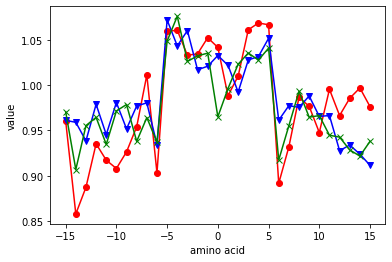

SUEM840102


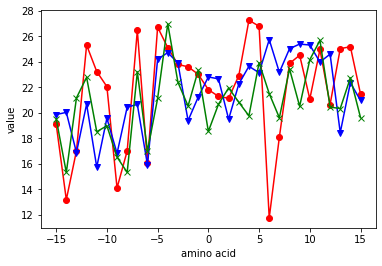

SWER830101


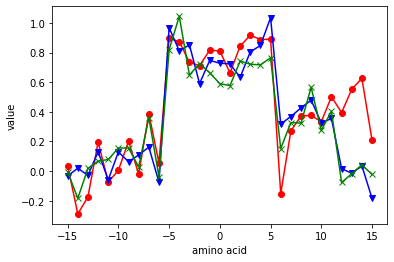

TANS770101


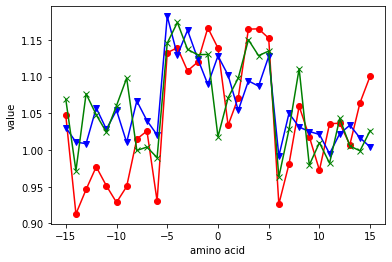

TANS770102


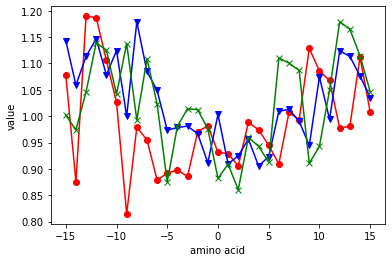

TANS770103


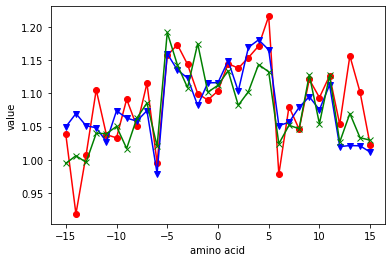

TANS770104


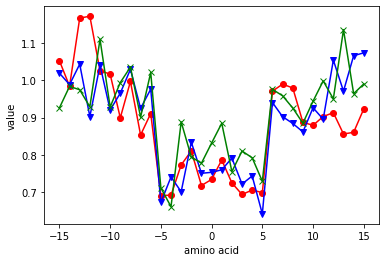

TANS770105


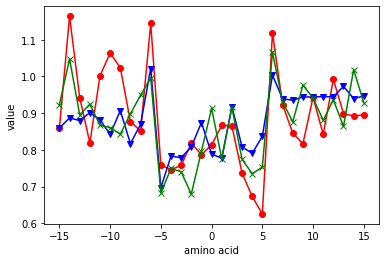

TANS770106


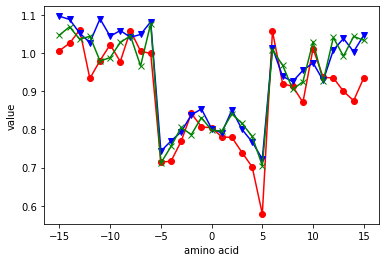

TANS770107


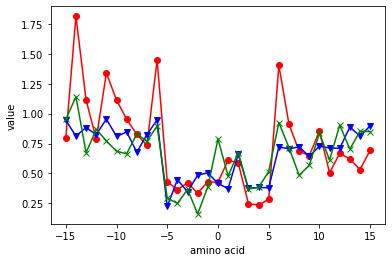

TANS770108


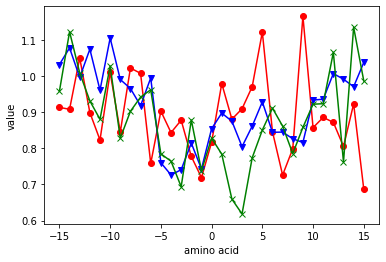

TANS770109


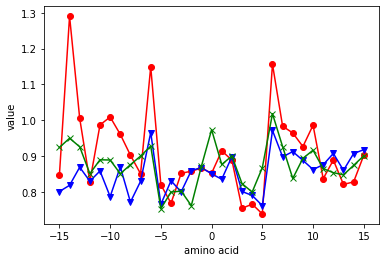

TANS770110


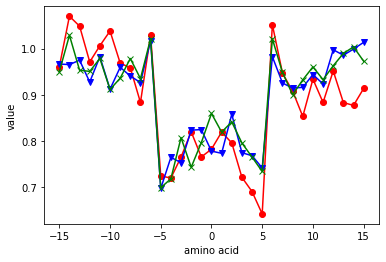

VASM830101


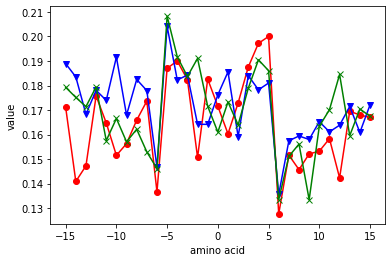

VASM830102


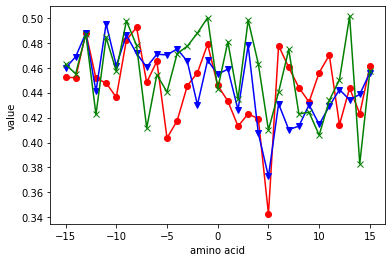

VASM830103


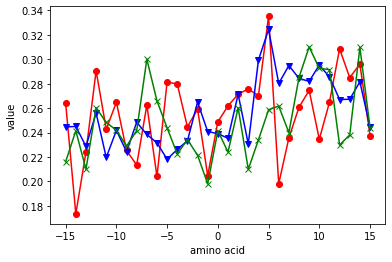

VELV850101


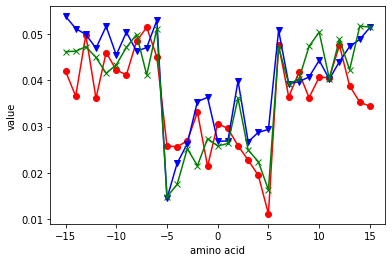

VENT840101


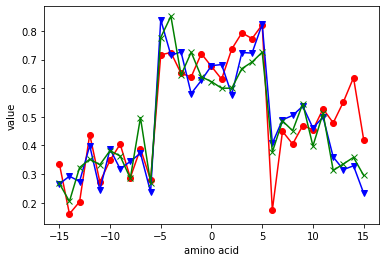

VHEG790101


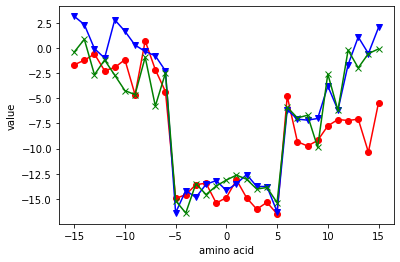

WARP780101


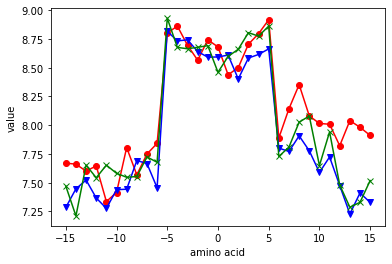

WEBA780101


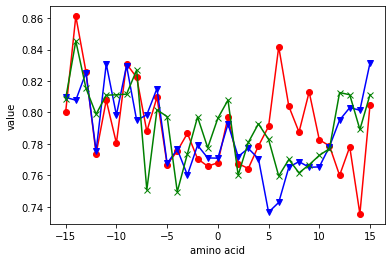

WERD780101


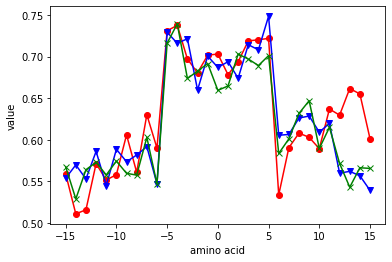

WERD780102


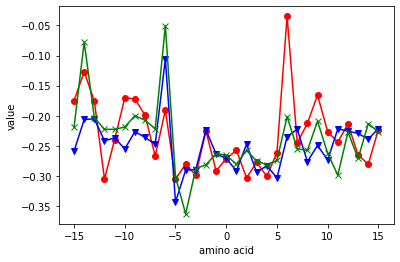

WERD780103


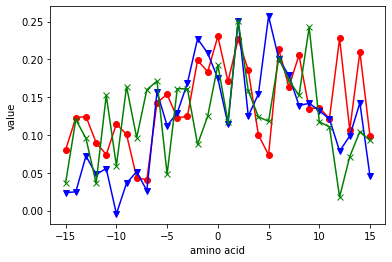

WERD780104


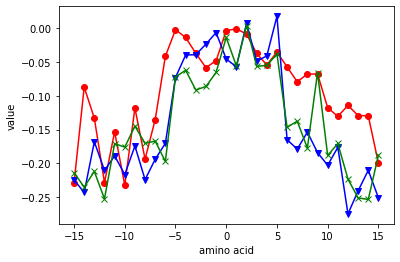

WOEC730101


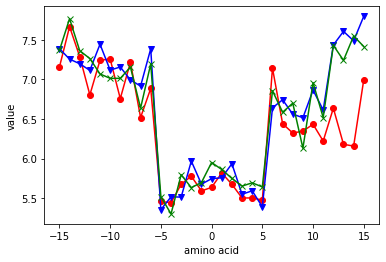

WOLR810101


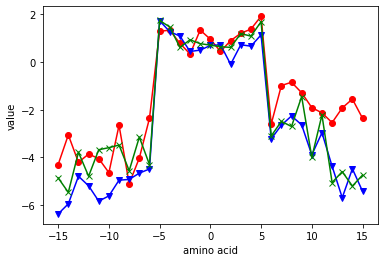

WOLS870101


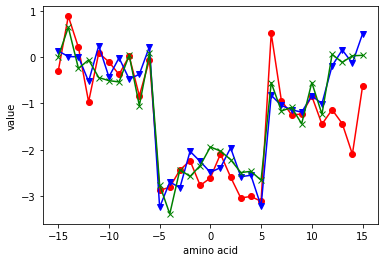

WOLS870102


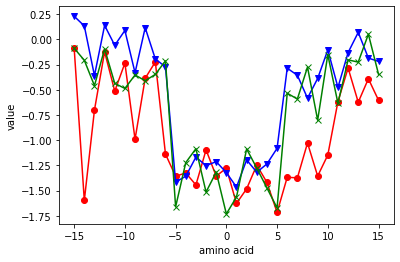

WOLS870103


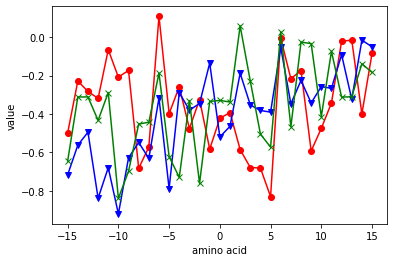

YUTK870101


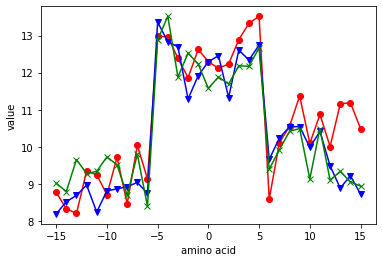

YUTK870102


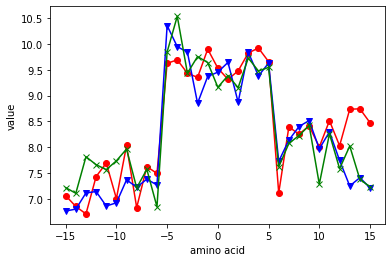

YUTK870103


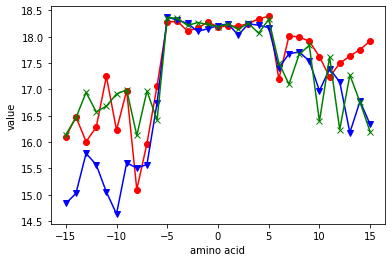

YUTK870104


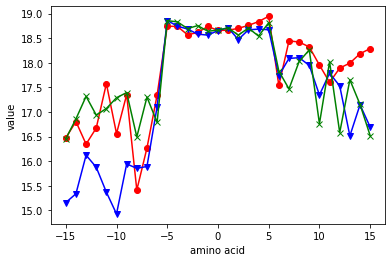

ZASB820101


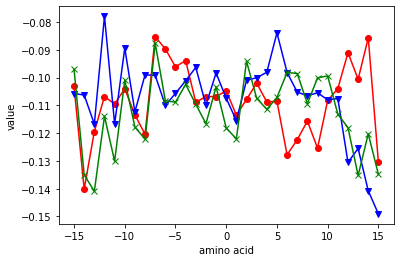

ZIMJ680101


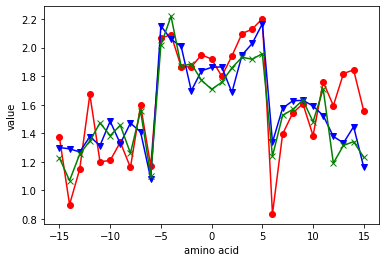

ZIMJ680102


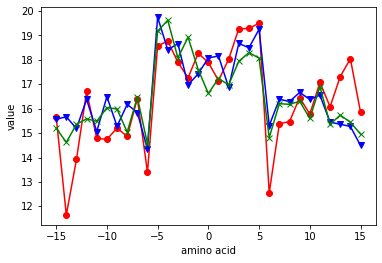

ZIMJ680103


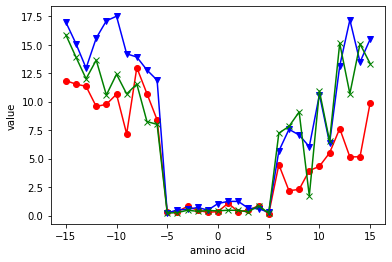

ZIMJ680104


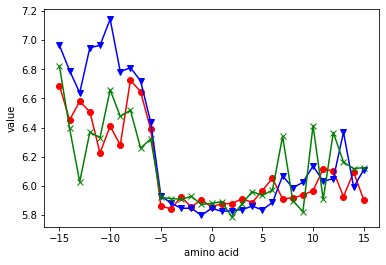

ZIMJ680105


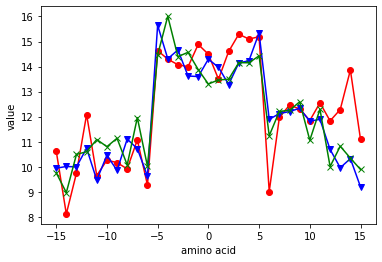

AURR980101


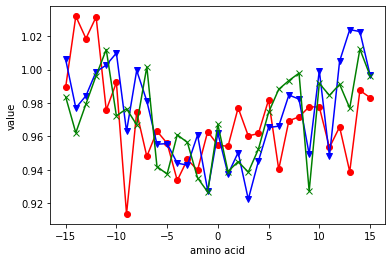

AURR980102


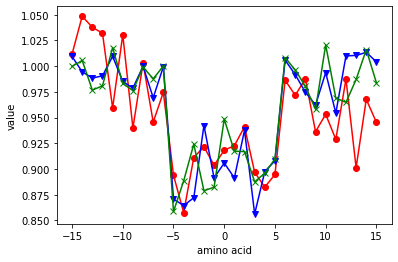

AURR980103


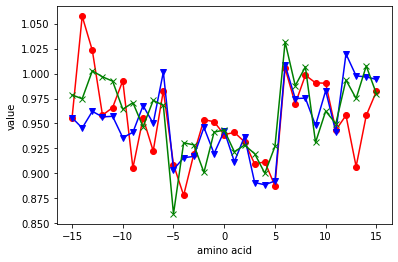

AURR980104


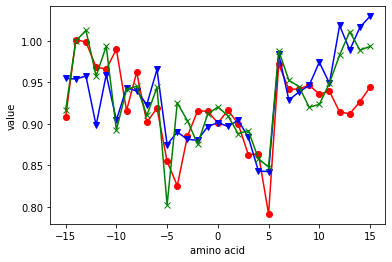

AURR980105


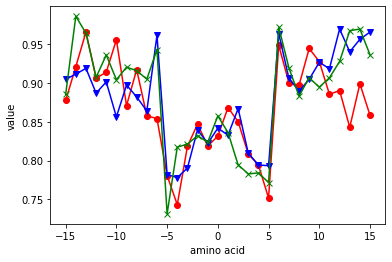

AURR980106


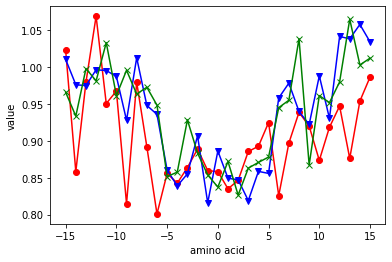

AURR980107


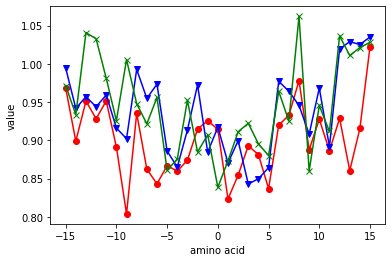

AURR980108


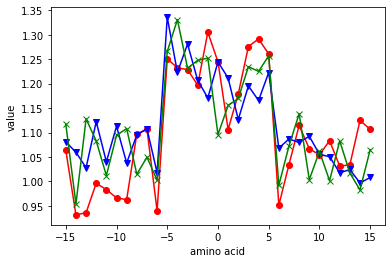

AURR980109


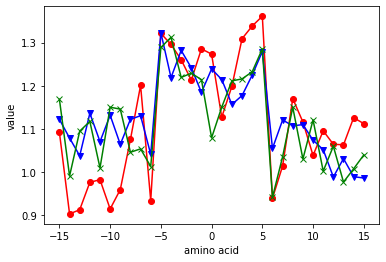

In [ ]:
import matplotlib.pyplot as plt


for index_pm, row_pm in pmave.iterrows():
    for index_gol, row_gol in golave.iterrows():
        for index_er, row_er in erave.iterrows():
            if index_pm==index_gol and index_pm==index_er:
                print (index_pm)
                plt.plot(columns , row_pm  , color = 'red'  , marker = 'o' )
                plt.plot(columns , row_gol , color = 'blue' , marker = 'v' )
                plt.plot(columns , row_er  , color = 'green', marker = 'x' )
                plt.xlabel('amino acid')
                plt.ylabel('value')
                plt.show()
                